# Analysis of predictions on yellow fever simulated reads

This notebooks comes after:
1. Preprocessing and Read Simulation ([nb](ref_4.01_yf_ncbi_data_preproc_pipeline.ipynb)) 
    - Original reference sequence fasta file modified into `/data/ncbi/refsequences/yf/yf_2023_yellow_fever.fa`
    - ART Illumina simulation into 150-mer reads (single) saved in `data/ncbi/simreads/yf/single_69seq_150bp`
2. Inference using CNN Virus on simreads ([nb](ref_4.13_yf_ncbi_inference_local_all_refseqs.ipynb))
    - Prediction of read virus label and position label using CNN Virus original model
    - Generation of an inference report in csv format (one file per refseq) and saved in `data/ncbi/infer_results/yf-ncbi/local-inf` directory.

In this notebook, we will:
- Load the inference reports into one single dataframe for analysis
- Perform the following analysis:
    - mean accuracy per reference sequence
    - mean accuracy per read position in the reference sequence
    - mean accuracy per number or mutations

Main variables defined throughout the notebook:
- `df`: dataframe containing the inference data for each simulated read, and additional engineered data
- `df_refseq`: dataframe containing all reference sequences and additional data such as mean accuracy
- `aln`: file reader for alignment file generated by ART Illumina simulation
- `ordered_index`: list of reference sequence ids sorted by decreasing mean accuracy
- `refseq_meta`: dictionary with metadata for each reference sequence
- `cnn_virus_fa`: file reader for fasta file containing the reference sequence used to train the CNN Virus model
- `cnn_virus_meta`: dictionary with metadata for the reference sequence used to train the CNN Virus model
- `sam_df`: dataframe containing alignment information to the CNN Virus reference sequence for each read as provided by Bowtie2
- `ds`: dataframe merging all simulated reads information (`df`) and bowtie2 alignment information (`sam_df`).

# 1. Imports and setup environment

In [ ]:
# Install required custom packages if not installed yet.
import importlib.util
if not importlib.util.find_spec('ecutilities'):
    print('installing package: `ecutilities`')
    ! pip install -qqU ecutilities
else:
    print('`ecutilities` already installed')
if not importlib.util.find_spec('metagentools'):
    print('installing package: `metagentools')
    ! pip install -qqU metagentools
else:
    print('`metagentools` already installed')

`ecutilities` already installed
`metagentools` already installed


In [ ]:
# Import all required packages
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import re
import seaborn as sns
import time

from Bio import Align
from datetime import datetime
from ecutilities.core import files_in_tree
from ecutilities.ipython import nb_setup
from functools import partial
from IPython.display import display, update_display
from matplotlib.font_manager import FontProperties
from matplotlib.gridspec import GridSpec
from nbdev import show_doc
from pandas import HDFStore
from pathlib import Path
from pprint import pprint
from tqdm.notebook import tqdm, trange
from typing import List, Tuple, Dict, Any, Generator

# Setup the notebook for development
nb_setup()

from metagentools.cnn_virus.data import FastaFileReader, FastqFileReader, AlnFileReader, TextFileBaseReader
from metagentools.cnn_virus.data import OriginalLabels
from metagentools.core import ProjectFileSystem

Set autoreload mode


# 2. Setup paths to files and load data

### Key folders and system information

In [ ]:
pfs = ProjectFileSystem()
pfs.info()

Running linux on local computer
Device's home directory: /home/vtec
Project file structure:
 - Root ........ /home/vtec/projects/bio/metagentools 
 - Data Dir .... /home/vtec/projects/bio/metagentools/data 
 - Notebooks ... /home/vtec/projects/bio/metagentools/nbs


### Load all inference reports

During inference, the model predicts virus labels and relative position for all simulated reads created from reference sequences. 

During inference an inference report file was saved in csv format, one file per reference sequence. The report records the following columns:
- `readid`: unique identifier for the simread (as index)
- `refseqid`: identifier of the reference sequence the simread was created from
- `accuracy`: bool whether the prediction was correct (YFV )or not (another virus)
- `lbl_true`: 118, label for YFV
- `lbl_pred`: predicted label
- `pos_true`: position of the simread first base pair in the reference sequence (extracted from aln file provided by ART Illumina)
- `pos_pred`: relative position of the simread in the reference sequence as predicted by the model (0-9)
- `preds_score`: a score of the consistency of the 101 50-mer predictions in the prediction process. The higher the better
- `probs_score`: a score of the consistency of the 101 50-mer probabilities in the prediction process. The higher the better
- `top_5_lbl_pred_0` -	`top_5_lbl_pred_4`: the top 5 prediction by CNN Virus model

We will load all these files into a single dataframe for analysis.

Retrieve the path to each of the inference report files:

In [ ]:
p2report_dir = pfs.data/'ncbi/infer_results/yf-ncbi/local-inf'
assert p2report_dir.is_dir()
report_files = sorted([p for p in p2report_dir.glob('*.csv') if not p.stem.endswith('original')])
nb_refseqs = len(report_files)
print(f"Identified {nb_refseqs:,d} inference report files\n")
print(f"Including:")
print('\n'.join([f" - {l}" for l in report_files[:3]]))

Identified 69 inference report files

Including:
 - /home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_1.csv
 - /home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_10.csv
 - /home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_11.csv


Consolidate all inference report data into one DataFrame and add columns:
1. load each report and append it to `df`
2. add an `accuracy` columns
3. reorder the columns in a convenient order

In [ ]:
df = pd.DataFrame()

for p in report_files:
    df_p = pd.read_csv(p, index_col=0)
    df_p['accuracy'] = df_p['lbl_pred'] == df_p['lbl_true']
    df = df_p if df.empty else pd.concat([df, df_p])

report_cols = ['refseqid','accuracy','lbl_true','lbl_pred','pos_true','pos_pred','preds_score', 'probs_score',
               'top_5_lbl_pred_0','top_5_lbl_pred_1', 'top_5_lbl_pred_2', 'top_5_lbl_pred_3','top_5_lbl_pred_4']

df = df.loc[:, report_cols]
print(f"{df.shape[0]:,d} predictions")
print(f"{df.shape[0]//nb_refseqs:,d} predictions for each of the {nb_refseqs} reference sequences in average")
df.sample(3)

1,160,250 predictions
16,815 predictions for each of the 69 reference sequences in average


,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4
readid,,,,,,,,,,,,,
11089:ncbi:45-12533,11089:ncbi:45,True,118,118,254,9,0.599852,0.322331,118,143,130,67,9
11089:ncbi:40-8590,11089:ncbi:40,False,118,62,5611,5,0.075444,0.046174,62,118,157,126,91
11089:ncbi:19-6335,11089:ncbi:19,True,118,118,3683,6,2.054734,0.666367,118,9,130,13,104


# 3. Accuracy per reference sequence

> **Important Note on metrics**: 
>
>The accuracy is calculated as the percentage of the simulated reads that were correctly classified. This is calculated as the number of reads classified as the correct reference sequence divided by the total number of reads simulated for that reference sequence.
>
> In effect, we have a binary classification problem here because all the simulated reads are generated from Yellow Fever. 
>
>In addition, predictions can only be either True Positive or False Negative. There cannot be True Negatives or False Positive. 
>
> Consequently, **Accuracy** = **Recall**. And we ca cannot evaluate Precision.
>
> Therefore, the entire analysis below focuses on the **Accuracy** = **Recall** metric.

Create a dataframe with one row per reference sequence and metadata information.

We will retrieve the list of reference sequences from tha alignement file (aln) created by ART Illumina during the read simulation process.

In [ ]:
p2aln = pfs.data / 'ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.aln'
assert p2aln.is_file()

aln = AlnFileReader(p2aln)
refseqs_meta = aln.parse_header_reference_sequences()
cols = 'refseq_accession;organism;info;refseq_length'.split(';')

df_refseqs =  pd.DataFrame(refseqs_meta).T
df_refseqs['info'] = df_refseqs[['refseq_accession','organism']].apply(lambda x: f"{x[0]} ({x[1]})", axis=1)
df_refseqs.refseq_length = df_refseqs.refseq_length.astype(int)
df_refseqs = df_refseqs.loc[:, cols]
df_refseqs.head(3)

,refseq_accession,organism,info,refseq_length
11089:ncbi:1,AY968064,Angola_1971,AY968064 (Angola_1971),10234
11089:ncbi:2,U54798,Ivory_Coast_1982,U54798 (Ivory_Coast_1982),10231
11089:ncbi:3,DQ235229,Ethiopia_1961,DQ235229 (Ethiopia_1961),10234


Add a column to `df_refseqs` with the mean accuracy for each reference sequence.

In [ ]:
df_refseqs['mean acc'] = df.groupby('refseqid')['accuracy'].mean()
df_refseqs.head(3)

,refseq_accession,organism,info,refseq_length,mean acc
11089:ncbi:1,AY968064,Angola_1971,AY968064 (Angola_1971),10234,0.172176
11089:ncbi:2,U54798,Ivory_Coast_1982,U54798 (Ivory_Coast_1982),10231,0.869059
11089:ncbi:3,DQ235229,Ethiopia_1961,DQ235229 (Ethiopia_1961),10234,0.181824


Bar plot of these accuracies, sorted in decreasing order, with `info` as the label for readibility.

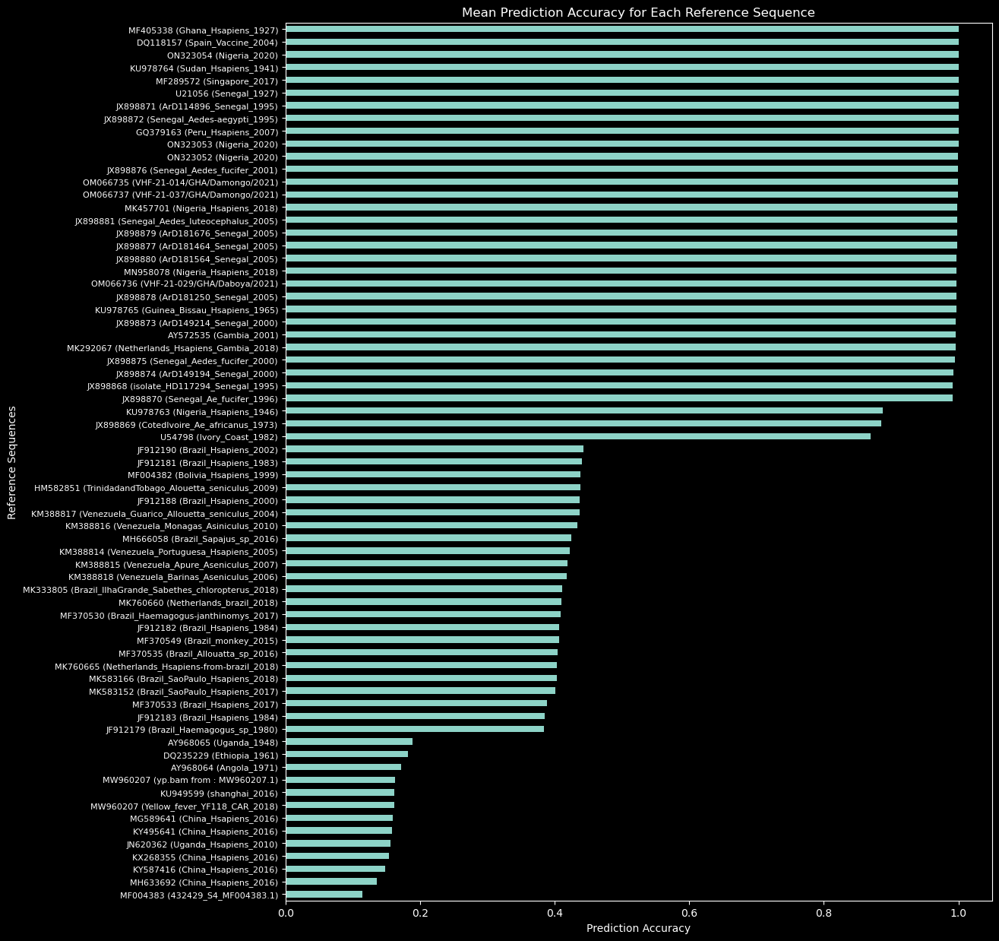

In [ ]:
font_properties = FontProperties(family='sans-serif', style='normal', size=8)

to_plot = df_refseqs.copy()
to_plot.index = pd.Index(to_plot['info'])
fig, ax = plt.subplots(figsize=(12, 15))
to_plot.sort_values(by=['mean acc'])['mean acc'].plot(ax=ax, kind='barh', x='mean acc')
ax.set_yticklabels(ax.get_yticklabels(), fontproperties=font_properties)
ax.set_title('Mean Prediction Accuracy for Each Reference Sequence');
ax.set_xlabel('Prediction Accuracy');
ax.set_ylabel('Reference Sequences');

> Note: all reference sequence have the same lenght, that is 10,237 bp

In [ ]:
print(f"Reference sequence length ranging between {df_refseqs.refseq_length.min():,d} and {df_refseqs.refseq_length.max():,d}")

Reference sequence length ranging between 10,014 and 10,234


# 4. Impact of Read Position on Accuracy

In [ ]:
df.head(3)

,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4
readid,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,118,43,3131,6,0.124630,0.048955,32,117,121,181,43
11089:ncbi:1-16999,11089:ncbi:1,True,118,118,27,0,2.204142,0.516952,118,6,10,32,3
11089:ncbi:1-16998,11089:ncbi:1,False,118,108,1865,9,0.085060,0.042813,108,22,63,159,35


The true position (`pos_true)`) is the position of the first BP in the simulated reads, in the non  aligned reference sequence. As the reads are 150-mers reads in this datasets, we will not find any true position greater than the sequence length - 150.

> Important Note
>
> To compare the impact of read position on the prediction accuracy, we would better work on the basis of aligned positions and not the original sequence position because it will be more comparable between sequences.
>
> Therefore, we will add one columns `alpos` for aligned poosition.

## Mapping read positions in aligned and original reference sequences

In [ ]:
p2refseqs = pfs.data / 'ncbi/refsequences/yf/yf_2023_yellow_fever.fa'
assert p2refseqs.is_file()
p2aligned = pfs.data / 'ncbi/refsequences/yf/yf_2023_yellow_fever_aligned.fa'
assert p2aligned.is_file()
fa_refseqs = FastaFileReader(p2refseqs)
fa_aligned = FastaFileReader(p2aligned)

In [ ]:
refseqid = '11089:ncbi:1'

fa_refseqs.reset_iterator()
fa_aligned.reset_iterator()
lengths_aligned_seq = []

for o1, o2 in zip(fa_refseqs, fa_aligned):
    seq_refseq = o1['sequence']
    dfn = o2['definition line']
    seq_aligned = o2['sequence']
    lengths_aligned_seq.append(len(seq_aligned))
    if fa_aligned.parse_text(dfn)['seqid'] == refseqid:
        len_refseq = len(seq_refseq)
        len_alseq = len(seq_aligned)
        pos_first_gap = seq_aligned.index('-')
        n = 10
        digits_str = ' '.join('0 1 2 3 4 5 6 7 8 9'.split(' ')) + ' '
        print(f"{refseqid}: first gap at position {pos_first_gap:,d} in the aligned sequence:")
        print("non aligned:")
        print('          '+ digits_str+' '.join('...')+' '+digits_str)
        print('         |'+'|'.join(seq_refseq[pos_first_gap-n:pos_first_gap]) + '| | | |' + '|'.join(seq_refseq[pos_first_gap:pos_first_gap+n]))
        print("aligned:")
        print('          '+ digits_str + digits_str + ' '.join('012'))
        print('         |'+ '|'.join(seq_aligned[pos_first_gap-n:pos_first_gap]) + '|' + '|'.join(seq_aligned[pos_first_gap:pos_first_gap+n+3]))
        print("mapping:")
        print('          '+ digits_str+' '.join('...')+' '+digits_str)
        print('          '+ '^ '*n + '. . . ' + '^ '*n)
        print('          '+ digits_str + digits_str + ' '.join('012'))
        break
mean_length_aligned_seq = np.mean(lengths_aligned_seq)
print(f"Mean length of aligned sequences: {mean_length_aligned_seq:,.0f}")

11089:ncbi:1: first gap at position 7,993 in the aligned sequence:
non aligned:
          0 1 2 3 4 5 6 7 8 9 . . . 0 1 2 3 4 5 6 7 8 9 
         |G|C|A|A|C|T|G|A|G|G| | | |G|T|G|A|G|A|G|G|A|C
aligned:
          0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2
         |G|C|A|A|C|T|G|A|G|G|-|-|-|G|T|G|A|G|A|G|G|A|C
mapping:
          0 1 2 3 4 5 6 7 8 9 . . . 0 1 2 3 4 5 6 7 8 9 
          ^ ^ ^ ^ ^ ^ ^ ^ ^ ^ . . . ^ ^ ^ ^ ^ ^ ^ ^ ^ ^ 
          0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2
Mean length of aligned sequences: 10,237


Create a mapping list `p2a` for position to aligned position which converts the position of the bp in the original reference sequence to the position in the aligned reference sequence.

In [ ]:
p2a = []
for i, bp in enumerate(seq_aligned):
    if bp != '-': p2a.append(i)    

print(f"First gap in {refseqid} at position {pos_first_gap:,d} in the aligned sequence")
print(f"values in p2a around index {pos_first_gap:,d}")
pd.DataFrame(data={'p2a value': p2a})[pos_first_gap-3:pos_first_gap+6]

First gap in 11089:ncbi:1 at position 7,993 in the aligned sequence
values in p2a around index 7,993


,p2a value
7990,7990
7991,7991
7992,7992
7993,7996
7994,7997
7995,7998
7996,7999
7997,8000
7998,8001


In [ ]:
class Original2AlignedPositionMapper:
    def __init__(self, fa: FastaFileReader):
        self.fa = fa
        self.mapping = {}
        self._create_mapping()

    def _create_mapping(self):
        self.fa.reset_iterator()
        for o in self.fa:
            dfn = o['definition line']
            refseqid = self.fa.parse_text(dfn)['seqid']
            seq = o['sequence']
            p2a = []
            for i, bp in enumerate(seq_aligned):
                if bp != '-': p2a.append(i)  
            self.mapping[refseqid] = p2a

    def __call__(self, idx:int, refseqid:str) -> int:
        return self.mapping[refseqid][idx]

p2a = Original2AlignedPositionMapper(fa=fa_aligned)

print(refseqid)
p2a.mapping[refseqid][7990:8000]

11089:ncbi:1


[7990, 7991, 7992, 7996, 7997, 7998, 7999, 8000, 8001, 8002]

Add the columns `alpos` to `df` and `df_refseqs` with the aligned position of the first bp in the read.

In [ ]:
df['pos_alg'] = df.loc[:, ['refseqid','pos_true']].apply(lambda row: p2a(row['pos_true'], row['refseqid']), axis=1)

coi = [
    'refseqid', 'accuracy', 'lbl_true', 'lbl_pred', 'pos_true', 'pos_pred', 'pos_alg',
    'preds_score', 'probs_score', 
    'top_5_lbl_pred_0', 'top_5_lbl_pred_1','top_5_lbl_pred_2', 'top_5_lbl_pred_3', 'top_5_lbl_pred_4'
    ]

df = df.loc[:, coi]
df.head()

,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,pos_alg,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4
readid,,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,118,43,3131,6,3131,0.124630,0.048955,32,117,121,181,43
11089:ncbi:1-16999,11089:ncbi:1,True,118,118,27,0,27,2.204142,0.516952,118,6,10,32,3
11089:ncbi:1-16998,11089:ncbi:1,False,118,108,1865,9,1865,0.085060,0.042813,108,22,63,159,35
11089:ncbi:1-16997,11089:ncbi:1,False,118,93,2247,1,2247,-0.000000,0.000392,93,163,117,66,177
11089:ncbi:1-16996,11089:ncbi:1,False,118,32,7518,3,7518,-0.000000,0.000264,32,51,99,72,10


Check that the mapping is done properly by checking positions in the vicinity of the first gap in 11089:ncbi:1

In [ ]:
df.loc[df.refseqid == refseqid, :].loc[df.loc[:, 'pos_true'].between(7990, 8000), ['refseqid', 'pos_true', 'pos_alg']].sort_values(by=['pos_true'])


,refseqid,pos_true,pos_alg
readid,,,
11089:ncbi:1-2768,11089:ncbi:1,7990,7990
11089:ncbi:1-13189,11089:ncbi:1,7991,7991
11089:ncbi:1-10896,11089:ncbi:1,7991,7991
11089:ncbi:1-5559,11089:ncbi:1,7992,7992
11089:ncbi:1-2349,11089:ncbi:1,7993,7996
11089:ncbi:1-15130,11089:ncbi:1,7995,7998
11089:ncbi:1-10737,11089:ncbi:1,7995,7998
11089:ncbi:1-12884,11089:ncbi:1,7996,7999
11089:ncbi:1-7307,11089:ncbi:1,7996,7999


## Binning of aligned positions (`pos_aln`)

Aligned sequences all have the same length:

In [ ]:
fa_refseqs.reset_iterator()
fa_aligned.reset_iterator()
print(f"{'refseqid':15s} {'non aligned'} {'aligned'}")
for o1, o2 in zip(fa_refseqs,fa_aligned):
    dfn = o2['definition line']
    refseqid = fa_aligned.parse_text(dfn)['seqid']
    seq1 = o1['sequence']
    seq2 = o2['sequence']
    print(f"{refseqid:15s} {len(seq1):,d}      {len(seq2):,d} bp")

refseqid        non aligned aligned
11089:ncbi:1    10,234      10,237 bp
11089:ncbi:2    10,231      10,237 bp
11089:ncbi:3    10,234      10,237 bp
11089:ncbi:4    10,231      10,237 bp
11089:ncbi:5    10,231      10,237 bp
11089:ncbi:6    10,231      10,237 bp
11089:ncbi:7    10,234      10,237 bp
11089:ncbi:8    10,231      10,237 bp
11089:ncbi:9    10,231      10,237 bp
11089:ncbi:10   10,231      10,237 bp
11089:ncbi:11   10,231      10,237 bp
11089:ncbi:12   10,231      10,237 bp
11089:ncbi:13   10,231      10,237 bp
11089:ncbi:14   10,231      10,237 bp
11089:ncbi:15   10,231      10,237 bp
11089:ncbi:16   10,231      10,237 bp
11089:ncbi:17   10,231      10,237 bp
11089:ncbi:18   10,231      10,237 bp
11089:ncbi:19   10,231      10,237 bp
11089:ncbi:20   10,231      10,237 bp
11089:ncbi:21   10,231      10,237 bp
11089:ncbi:22   10,231      10,237 bp
11089:ncbi:23   10,231      10,237 bp
11089:ncbi:24   10,231      10,237 bp
11089:ncbi:25   10,231      10,237 bp
11089:ncbi:26 

We will bin the position in bins of 3 bps

In [ ]:
fa_aligned.reset_iterator()
aligned_seq_length = len(next(fa_aligned)['sequence'])

nb_bins = aligned_seq_length // 3

print(f"Using {nb_bins:,d} position bins. Each bin includes {aligned_seq_length//nb_bins} nucleotides")
# df['bin'], pos_bins = df['pos_true'], df['pos_true']
df['bin'], pos_bins = pd.cut(df['pos_alg'], bins=nb_bins, labels=range(0,nb_bins), retbins=True)
nb_reads_per_position = df.groupby(by='bin')['bin'].count().mean()
min_nb_reads_per_position = df.groupby(by='bin')['bin'].count().min()
max_nb_reads_per_position = df.groupby(by='bin')['bin'].count().max()
print(f"Average of {int(nb_reads_per_position):,d} reads per position bin (min:{min_nb_reads_per_position} max:{max_nb_reads_per_position})")
coi = 'refseqid,accuracy,bin,lbl_true,lbl_pred,pos_true,pos_alg,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4'.split(',')
df = df.loc[:,coi]
display(df.head(3))
print(min_nb_reads_per_position, max_nb_reads_per_position)

Using 3,412 position bins. Each bin includes 3 nucleotides
Average of 340 reads per position bin (min:75 max:418)


,refseqid,accuracy,bin,lbl_true,lbl_pred,pos_true,pos_alg,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4
readid,,,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,1059,118,43,3131,3131,6,0.124630,0.048955,32,117,121,181,43
11089:ncbi:1-16999,11089:ncbi:1,True,9,118,118,27,27,0,2.204142,0.516952,118,6,10,32,3
11089:ncbi:1-16998,11089:ncbi:1,False,630,118,108,1865,1865,9,0.085060,0.042813,108,22,63,159,35


75 418


In [ ]:
unique_positions = df['pos_true'].unique()
missing_pos = set(range(aligned_seq_length)).difference(set(df['pos_true'].unique()))
print(f"Sequences have {aligned_seq_length:,d} positions (from 0 to {aligned_seq_length-1:,d})")
print(f"Simulated reads (150-mer) start at one of {len(unique_positions):,d} unique positions.")
print(f"The difference {aligned_seq_length:,d} - {len(unique_positions):,d} = {aligned_seq_length-len(unique_positions):,d} is due to the 150 bp lenghts of the reads and the size of each bin")
print(f"The largest position in dataset is {max(unique_positions)} (from 0 to {max(unique_positions)})")
print(f"There are {len(missing_pos)} positions from {min(missing_pos)} to {max(missing_pos)} that are not possible in the reads")

Sequences have 10,237 positions (from 0 to 10,236)
Simulated reads (150-mer) start at one of 10,084 unique positions.
The difference 10,237 - 10,084 = 153 is due to the 150 bp lenghts of the reads and the size of each bin
The largest position in dataset is 10083 (from 0 to 10083)
There are 153 positions from 10084 to 10236 that are not possible in the reads


In [ ]:
print(refseqid)
df.loc[df['refseqid'] == refseqid, :].bin.max()

11089:ncbi:69


3410

In [ ]:
def plot_accuracy_per_position(df: pd.DataFrame, refseqid:str, figsize=(15,3), ax=None):
    df_ = df.loc[df['refseqid'] == refseqid, :]
    nb_position_bins = df_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    accuracy = df_['accuracy'].mean()
    acc_per_bin = df_.groupby('bin')['accuracy'].mean()
    acc_reindexed = acc_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=acc_reindexed.index, data=1.0) # np.nan is type float, so we use 1.0
    missing_bins.loc[acc_reindexed.notna()] = np.nan

    if ax is None: 
        fig,ax = plt.subplots(figsize=figsize)
        show_this_axis = True
    else:
        show_this_axis = False

    bar_w = 1 
    colors = acc_reindexed.apply(lambda x: 'red' if x < 0.6 else 'green')

    acc_reindexed.plot(ax=ax, kind='bar', ylim=(0,1), width=bar_w, color=colors, legend=False)
    missing_bins.plot(ax=ax, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax.set_title(f"Mean accuracy per position: {info} (mean full sequence:{accuracy:.3f})")
    ax.hlines(y=accuracy, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax.set_xticks(ticks, ticks)

    if show_this_axis: plt.show()

# plot_accuracy_per_position(df, '11089:ncbi:1',figsize=(15,2), ax=None)
# plot_accuracy_per_position(df, '11089:ncbi:6',figsize=(15,2), ax=None)

Plot accuracy for all reads starting at a specific position, for each reference sequence.

In [ ]:
ordered_refseq_index = df_refseqs.sort_values(by=['mean acc'], ascending=False).index

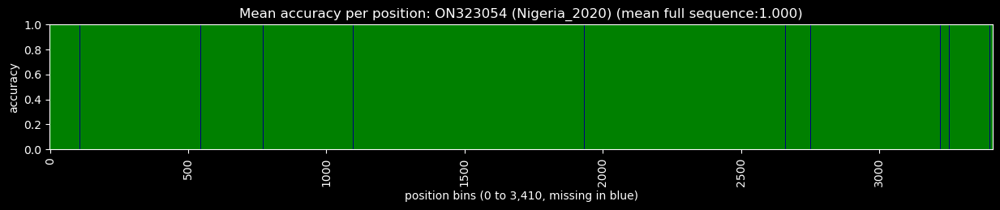

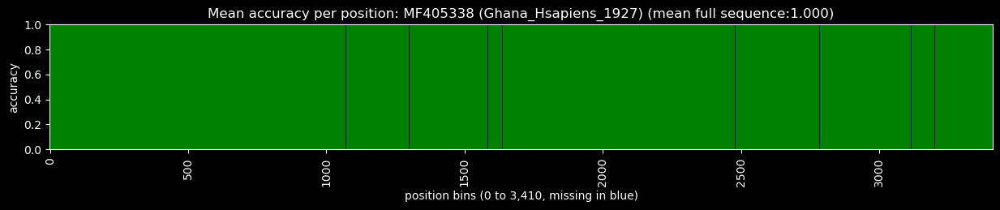

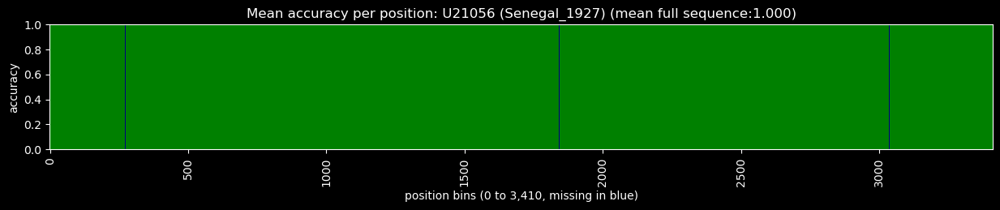

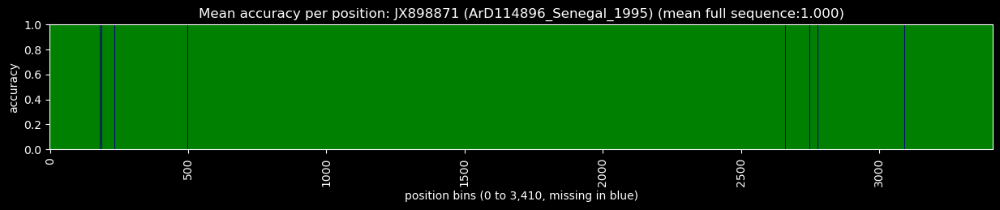

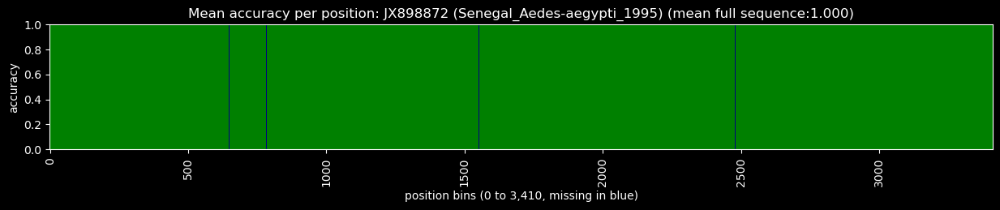

...

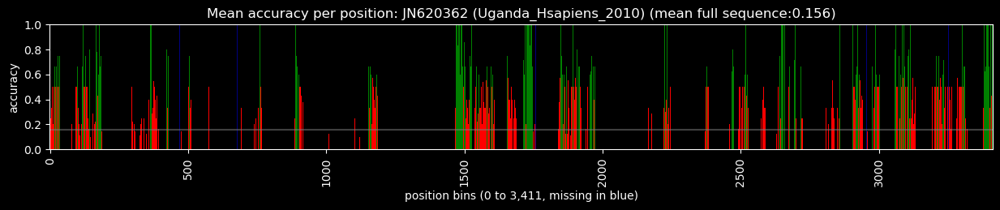

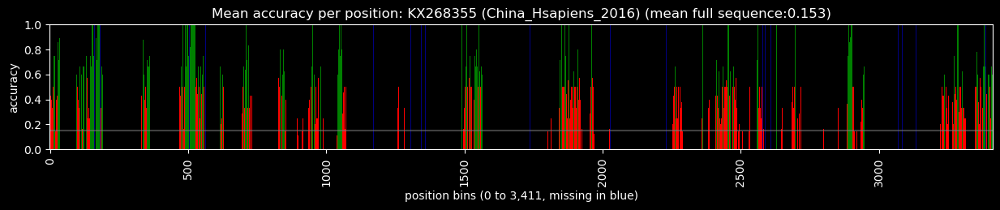

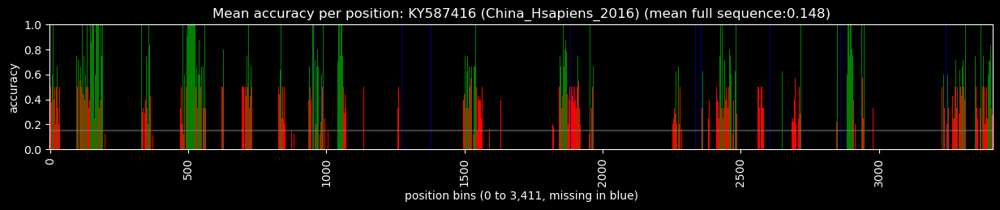

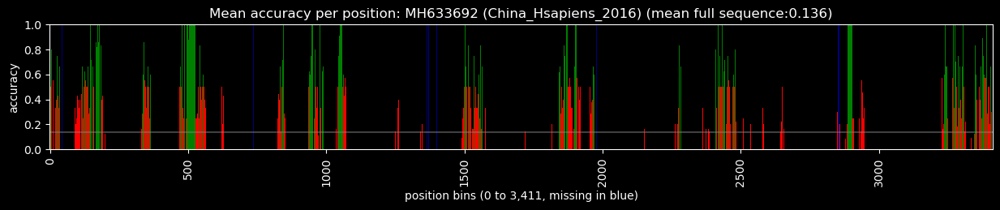

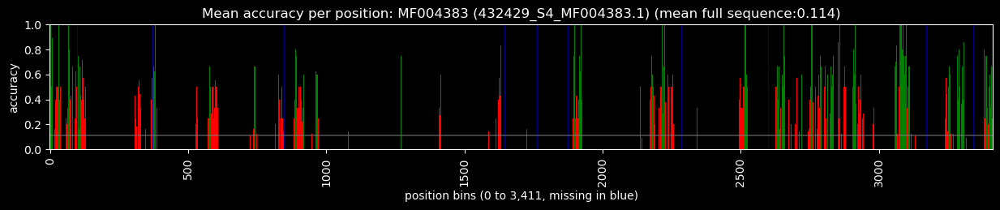

In [ ]:
for idx in ordered_refseq_index:
    plot_accuracy_per_position(df, idx, figsize=(15,2), ax=None)

## Analysis of Label Probabilities

CNN Virus model predicts the virus label on 50-mer reads. Longer reads (k-mer) are split into k-49 overlapping 50-mers using a sliding window. The model predicts the virus label for each of the (k-49) 50-mer reads. For each of the reads, the model predicts 187 probabilities (187 labels).

A decision is then taken in two steps:
- exclude any probability below a threshold (0.9 by default)
- majority vote among the remaining probabilities

For 150-mer reads, each read will lead to 101 x 187 = 18,887 probabilities. 

When looking into the the details of these probabilities (see images below) we can see that the model "hesitates" a lot between labels when accuracy is poor and is much more consistent when accuracy is good. When accuracy is high (plots in green), we clearly can see that many reads out of the 101 predict the same label.


<img src='../img/probs_profile_acc_low.png' width=400> <img src='../img/probs_profile_acc_high.png' width=400> 

It is not convenient to perform this type of deep analysis for all of the 1.7 million simreads. Instead, we use a metric whose value is higher when the model predict consistently (i.e. probabilities by successive 50-mer reads are the same). These two metrics are:
- preds_score: higher when the prediction for two succesive 50-mers are the same
- probs_score: higher when the probabilities for two succesive 50-mers are high

See the notebook *Inference using CNN Virus on simreads* ([nb](ref_4.13_yf_ncbi_inference_local_all_refseqs.ipynb)) for more info on these metrics

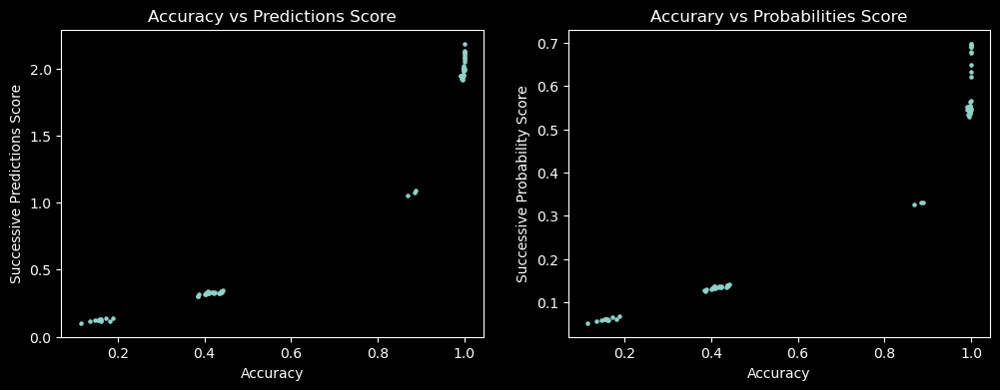

In [ ]:
coi = ['preds_score','probs_score','accuracy']
grouped = df.groupby(by='refseqid')[coi].mean().loc[ordered_refseq_index, :]

n = 4
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(3*n, n))
ax1.scatter(x=grouped['accuracy'], y=grouped['preds_score'], s=5)
ax1.set_title('Accuracy vs Predictions Score')
ax1.set_xlabel('Accuracy')
ax1.set_ylabel('Successive Predictions Score')
ax2.scatter(x=grouped['accuracy'], y=grouped['probs_score'],s=5)
ax2.set_title('Accurary vs Probabilities Score');
ax2.set_xlabel('Accuracy')
ax2.set_ylabel('Successive Probability Score');

There are obvious clusters in these plots:

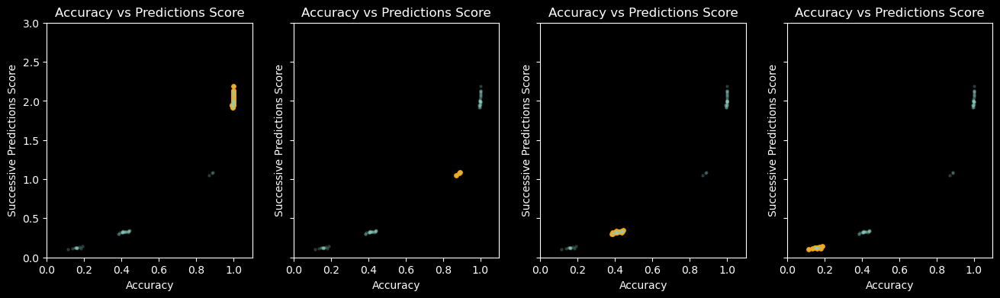

In [ ]:
def plot_cluster(ax, cluster, df: pd.DataFrame):
    ax.scatter(x=cluster['accuracy'], y=cluster['preds_score'], s=15, c='orange')
    ax.scatter(x=df['accuracy'], y=df['preds_score'], s=5, alpha=0.2)
    ax.set_title('Accuracy vs Predictions Score')
    ax.set_xlim((0,1.1))
    ax.set_ylim((0,3))
    ax.set_xlabel('Accuracy')
    ax.set_ylabel('Successive Predictions Score')

top_acc = grouped.loc[grouped.preds_score > 1.5, :].loc[grouped.accuracy > 0.8, :]
middle_high_acc = grouped.loc[grouped.preds_score < 1.5, :].loc[grouped.accuracy > 0.6, :]
middle_low_acc = grouped.loc[grouped.preds_score < 1, :].loc[grouped.accuracy > 0.3, :]
bottom_acc = grouped.loc[grouped.preds_score < 0.5, :].loc[grouped.accuracy < 0.3, :]

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(4*n, n), sharey=True)
for ax,dframe in zip(axs.flatten(), [top_acc, middle_high_acc, middle_low_acc, bottom_acc]):
    plot_cluster(ax, dframe, grouped)

plt.show()

TO DO:

Map the strain names/accession for each cluster onto the phylogenetic trees below:

Phylogenetic tree from "Continuous Circulation of Yellow Fever among Rural Populations in the Central African Republic" (2014)

The figure the maximum-likelihood trees built using IqTree v1.6.12 software based on the whole yellow-fever virus (YFV) genome (panel (a), GTR + F + R2 substitution model, 10,548 bp) or the envelope gene only (panel (b), TIM2e + I+G4 substitution model, 1455 bp). The strain described in this study is shown in blue. In panel (a), East African and East–Central African genotypes, indicated by an asterisk (*), cluster together artificially likely due to the lack of available full-length sequences.

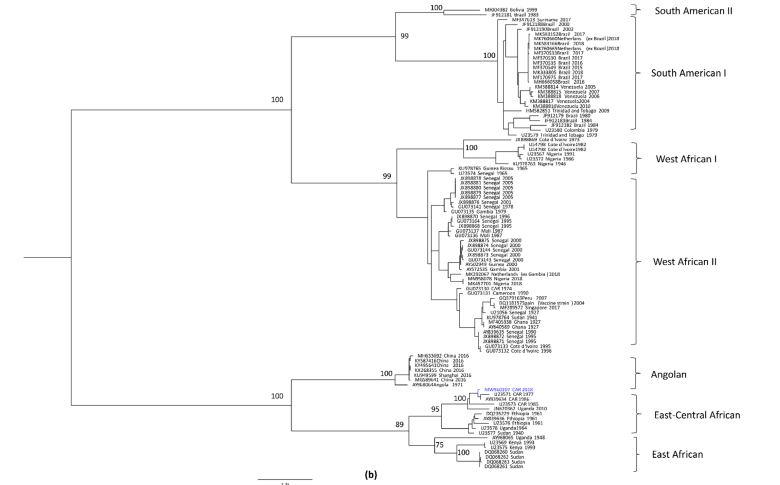

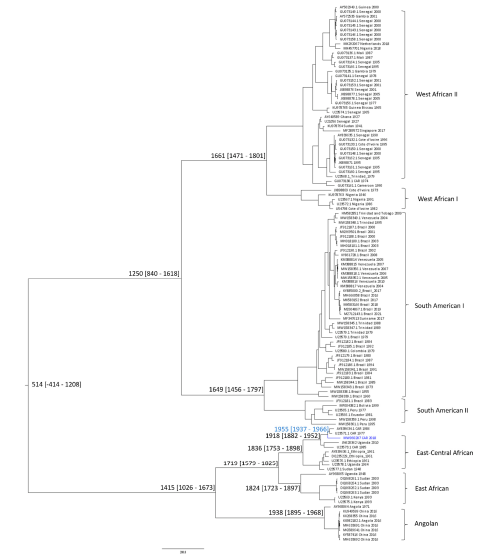

Figure 4. Bayesian chronogram of yellow-fever virus (YFV). The Bayesian analysis was performed on
the envelope gene (1455 bp). The YFV genome isolated in the Central African Republic is indicated
in blue. Median divergence times are indicated at the major nodes and the 95% highest posterior
density (HPD) is given in brackets. TMRCA is show in blue.

### Correlation between Probability Scores and Accuracy (mean value per sequence)

Evaluate and visualize the correlation between accuracy and probability scores (`preds_score` and `probs_score`) for each reference sequence.

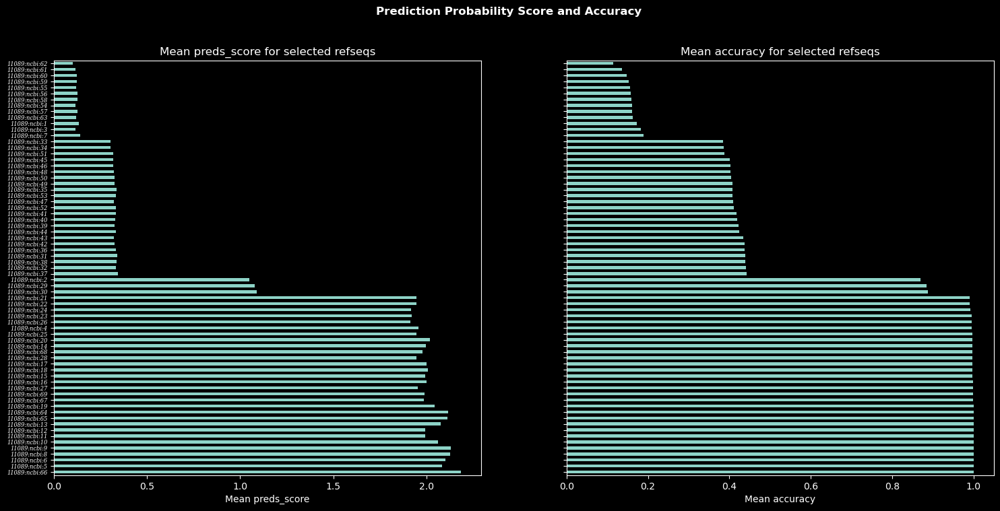

In [ ]:
font_properties = FontProperties(family='serif', style='italic', size=6)

fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(18, 8), sharey=True)
fig.suptitle('Prediction Probability Score and Accuracy', fontweight='bold')
grouped.preds_score.plot(ax=ax1, kind='barh', title='Mean preds_score for selected refseqs');
ax1.set_xlabel('Mean preds_score')
ax1.set_yticklabels(ax1.get_yticklabels(), fontproperties=font_properties)

grouped.accuracy.plot(ax=ax2, kind='barh',  title='Mean accuracy for selected refseqs');
ax2.set_xlabel('Mean accuracy');

In [ ]:
print(f"Correlation between prediction score and accuracy: {grouped.loc[:, ['preds_score', 'accuracy']].corr().iloc[0,0]:.3f}")

Correlation between prediction score and accuracy: 1.000


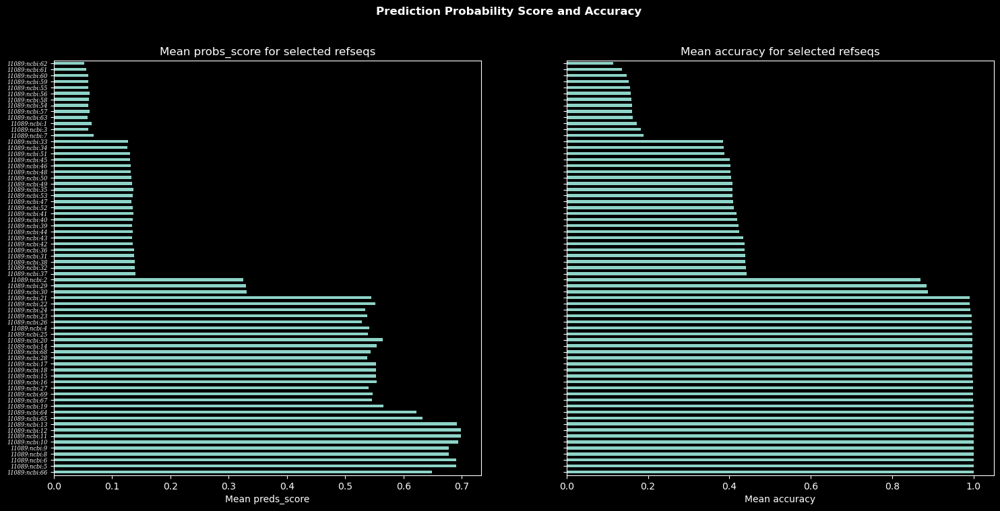

In [ ]:
font_properties = FontProperties(family='serif', style='italic', size=6)

fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(18, 8), sharey=True)
fig.suptitle('Prediction Probability Score and Accuracy', fontweight='bold')
grouped.probs_score.plot(ax=ax1, kind='barh', title='Mean probs_score for selected refseqs');
ax1.set_xlabel('Mean preds_score')
ax1.set_yticklabels(ax1.get_yticklabels(), fontproperties=font_properties)

grouped.accuracy.plot(ax=ax2, kind='barh',  title='Mean accuracy for selected refseqs');
ax2.set_xlabel('Mean accuracy');

In [ ]:
print(f"Correlation between probability score and accuracy: {grouped.loc[:, ['probs_score', 'accuracy']].corr().iloc[0,0]:.3f}")

Correlation between probability score and accuracy: 1.000


## Plot probability score per position

In [ ]:
def plot_analysis_per_position(df: pd.DataFrame, refseqid:str, metric='preds_score', figsize=(15,2*2+1)):
    df_ = df.loc[df['refseqid'] == refseqid, :]
    nb_position_bins = df_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    accuracy = df_['accuracy'].mean()
    acc_per_bin = df_.groupby('bin')['accuracy'].mean()
    acc_reindexed = acc_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=acc_reindexed.index, data=1., dtype=float)
    missing_bins.loc[acc_reindexed.notna()] = np.nan
    score = df_[metric].mean()
    score_per_bin = df_.groupby('bin')[metric].mean()
    score_reindexed = score_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)

    fig,(ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=figsize, sharex=True)
    fig.suptitle(f"Per Position Analysis for {info}", fontsize=16,fontweight='bold')

    # Plot Accuracy
    acc_threshold = 0.6
    bar_w = 1 
    colors_acc = acc_reindexed.apply(lambda acc: 'green' if acc > acc_threshold else 'red')

    acc_reindexed.plot(ax=ax1, kind='bar', ylim=(0,1), width=bar_w, color=colors_acc, legend=False)
    missing_bins.plot(ax=ax1, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax1.set_title(f"Accuracy per position bin (full sequence:{accuracy:.3f})",fontweight='bold')
    ax1.hlines(y=accuracy, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax1.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax1.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax1.set_xticks(ticks, ticks)

    # Plot scores 
    if metric == 'preds_score':
        score_threshold = 1.5
        ylim = (0,5)
    elif metric == 'probs_score':
        score_threshold = 0.4
        ylim = (0,1)
    else:
        score_threshold = 0.0
        ylim = (0,5)

    def color_score(row):
        acc, score = row
        if acc >= acc_threshold: high_acc = True
        else: high_acc = False
        if score >= score_threshold: high_score = True
        else: high_score = False
        color = 'green' if high_acc and high_score else 'red' if not high_acc else 'yellow'
        return color
    
    colors_score = pd.concat([acc_reindexed, score_reindexed], axis=1).apply(color_score, axis=1)
    score_reindexed.plot(ax=ax2, kind='bar', ylim=ylim, width=bar_w, color=colors_score, legend=False)
    missing_bins.plot(ax=ax2, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax2.set_title(f"{metric} per position bin (full sequence:{score:.3f})",fontweight='bold')
    ax2.hlines(y=score, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax2.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax2.set_ylabel(metric)
    ax2.set_xticks(ticks, ticks)

    plt.subplots_adjust(hspace=.25)
    plt.show()

# plot_analysis_per_position(df, '11089:ncbi:1')
# plot_analysis_per_position(df, '11089:ncbi:6')
# plot_analysis_per_position(df, '11089:ncbi:37')

In [ ]:
ordered_refseq_index = df_refseqs.sort_values(by=['mean acc'], ascending=False).index

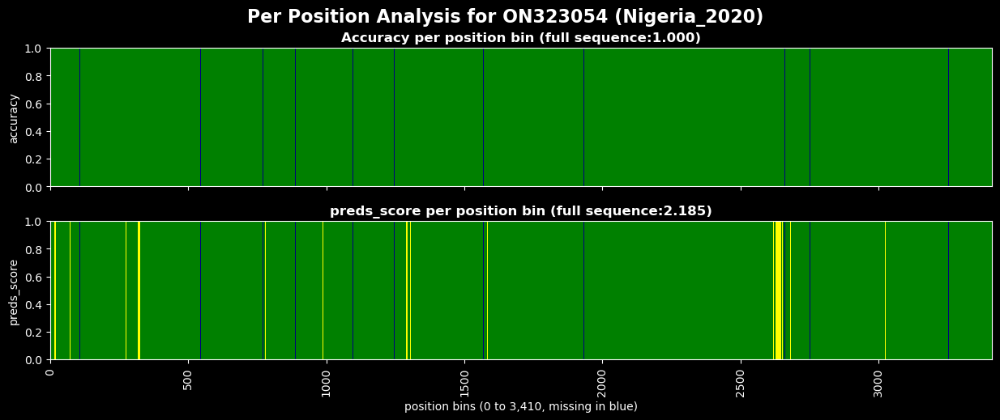

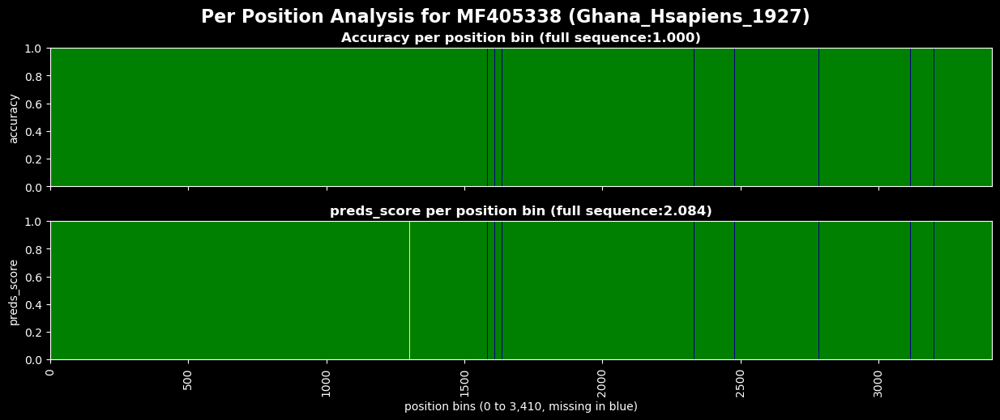

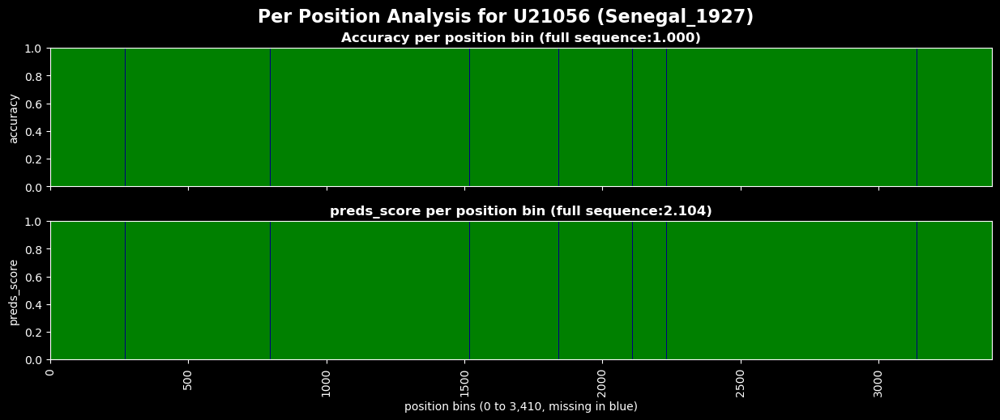

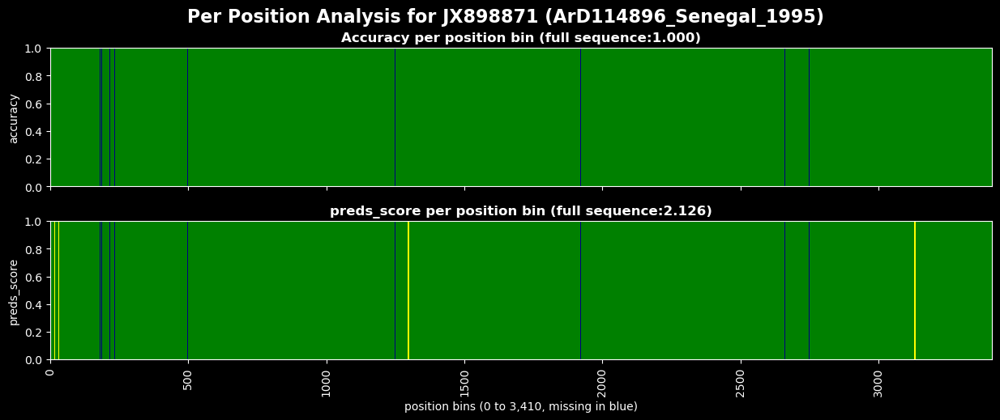

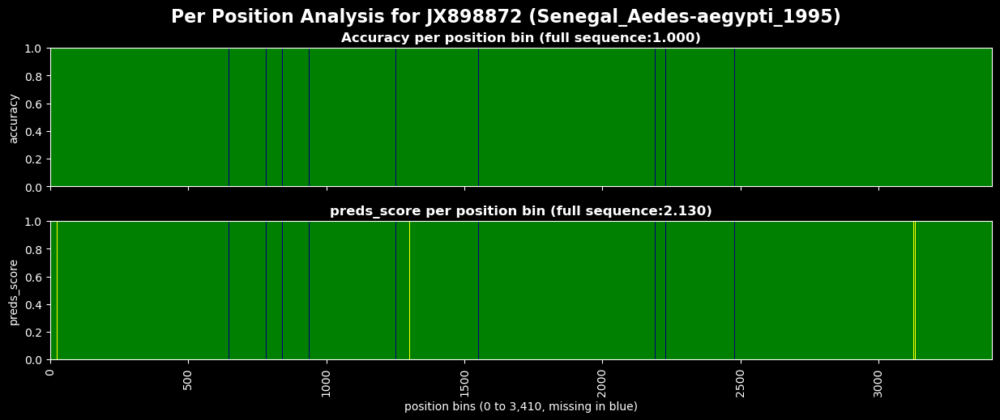

...

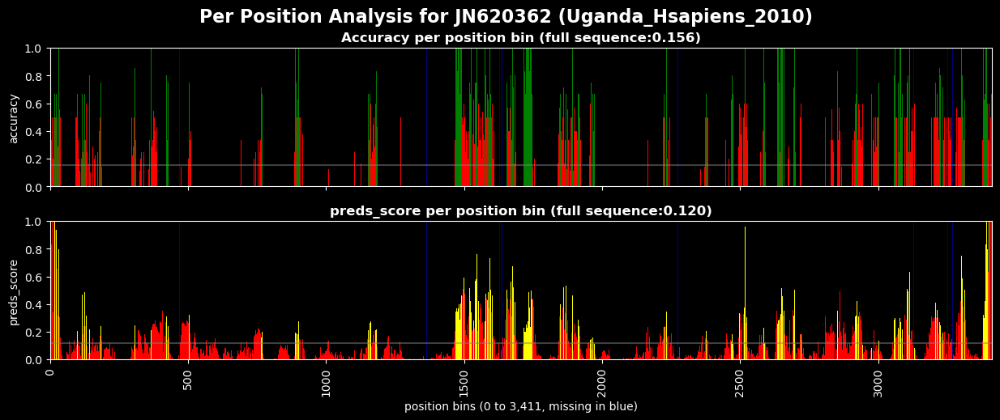

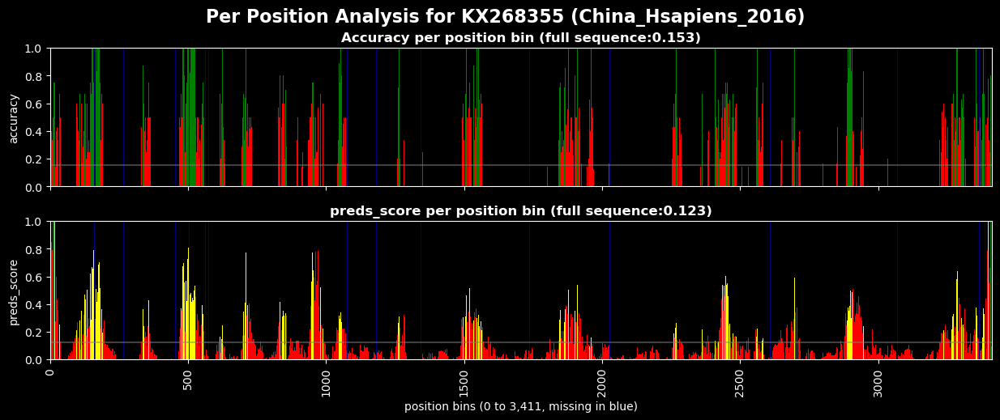

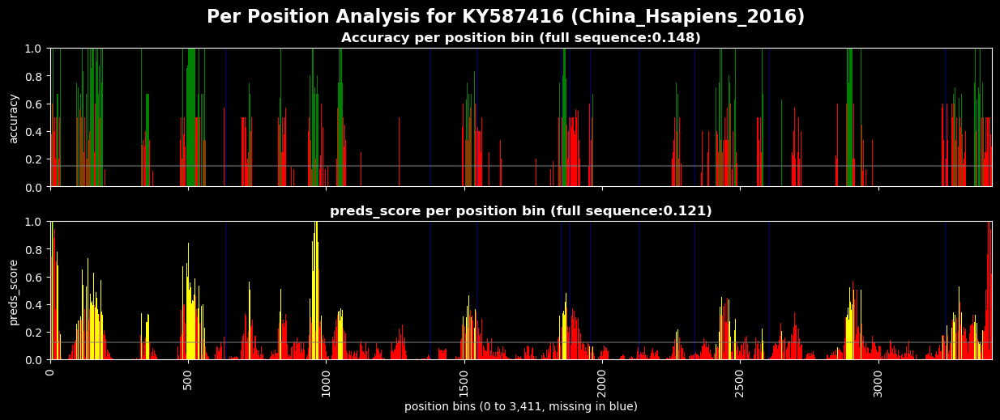

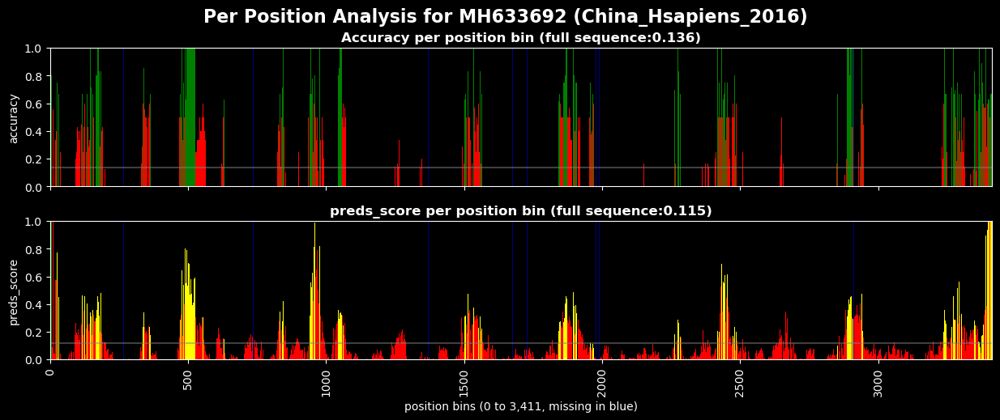

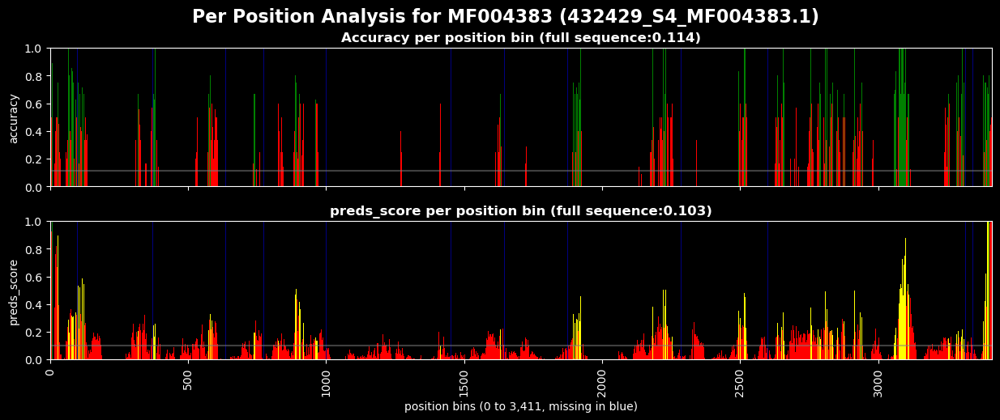

In [ ]:
for idx in ordered_refseq_index:
    plot_analysis_per_position(df, idx)

# 5. Impact Mutations on Accuracy

We have identified that CNN Virus model was trained with the simreads extracted from the strain with accession "NC_002031.1"

Information about simreads reference sequences:

In [ ]:
# Reference Sequence Info
fa = FastaFileReader(pfs.data/'ncbi/refsequences/yf/yf_2023_yellow_fever.fa')
aln = AlnFileReader(pfs.data/'ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.aln')
refseq_meta = aln.parse_header_reference_sequences()

Information about the training simreads reference sequence (accession "NC_002031.1"):

In [ ]:
# Training YFV Reference Sequence Info
p2cnn_virus_seq = pfs.data / 'ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa'
assert p2cnn_virus_seq.is_file()
cnn_virus_fa = FastaFileReader(p2cnn_virus_seq)
cnn_virus_meta = cnn_virus_fa.parse_file(add_seq=True)
cnn_virus_seq = cnn_virus_meta['11089:ncbi:0']['sequence']

print(f"Length Training Sequence:   {len(cnn_virus_seq):,d}")
print(f"Mean Length Aligned RefSeq: {mean_length_aligned_seq:,.0f}")

Length Training Sequence:   10,236
Mean Length Aligned RefSeq: 10,237


### Align reads and training reference sequence with bowtie2

Steps to proceed:
1. Build bowtie2 index for the CNN_Virus training sequence: 'data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa'
2. Align all simreads to the CNN_Virus training sequence
3. Extract the alignment information for each read (position, QMAP score, CIGAR string, etc.)

> Note: use fq files that does not include gaps !

### Create a bowtie2 index and align reads


From CLI in folder: `data/ncbi/bowtie2/yf`


For non end to end matches / trimmed:
```zsh
conda activate bowtie

bowtie2-build ~/projects/bio/metagentools/data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa NC_002031.1

bowtie2 --local -x NC_002031.1 -U ~/projects/bio/metagentools/data/ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.fq -S single_69seq_cnn_virus_refseq_trimmed.sam 

    1145126 reads; of these:
    1145126 (100.00%) were unpaired; of these:
        482900 (42.17%) aligned 0 times
        662140 (57.82%) aligned exactly 1 time
        86 (0.01%) aligned >1 times
    57.83% overall alignment rate

conda deactivate
```

For end to end matches / untrimmed:
```zsh
conda activate bowtie

bowtie2-build ~/projects/bio/metagentools/data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa NC_002031.1

bowtie2 -x NC_002031.1 -U ~/projects/bio/metagentools/data/ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.fq -S single_69seq_cnn_virus_refseq_untrimmed.sam 

    1145126 reads; of these:
    1145126 (100.00%) were unpaired; of these:
        615351 (53.74%) aligned 0 times
        529775 (46.26%) aligned exactly 1 time
        0 (0.00%) aligned >1 times
    46.26% overall alignment rate

conda deactivate
```

Some of the values returned by Bowtie2 after alignment —**mapped-bp**, **mapq**, and **score**— :

**Mapped-bp** refers to the total number of base pairs from the sequencing reads that were successfully aligned to the reference genome. This value is crucial as it indicates the extent of alignment, which can be used to assess the quality of the sequencing run and the effectiveness of the alignment process. A higher number of mapped base pairs generally suggests a better alignment performance, which is essential for downstream analyses such as variant calling or gene expression studies[1][3].

**Mapq** (mapping quality) is a score that reflects the confidence in the alignment of a read. It ranges from 0 to 60, where higher values indicate greater confidence. A MAPQ score of 0 typically suggests that the read could align to multiple locations in the genome, making it ambiguous, while higher scores (e.g., 10 or more) suggest that the read aligns uniquely and confidently to a specific location. This score helps in filtering out low-confidence alignments during analysis, enhancing the reliability of results derived from aligned reads[2][4].

The **score** represents the alignment quality based on a scoring system that accounts for matches, mismatches, and gaps in the alignment. Bowtie2 uses a scoring scheme similar to those found in other alignment algorithms like Needleman-Wunsch and Smith-Waterman. The score is calculated by starting with a maximum possible score and subtracting penalties for mismatches and gaps. A higher score indicates a better alignment, while lower scores reflect poorer alignments due to mismatches or gaps[1][3][5].


Citations:
- [1] https://gensoft.pasteur.fr/docs/bowtie2/2.1.0/
- [2] http://biofinysics.blogspot.com/2014/05/how-does-bowtie2-assign-mapq-scores.html
- [3] https://hbctraining.github.io/Intro-to-ChIPseq-flipped/lessons/04_alignment_using_bowtie2.html
- [4] https://www.biostars.org/p/48629/
- [5] https://www.seqanswers.com/forum/bioinformatics/bioinformatics-aa/29048-bowtie2-mapping-and-paired-end-reads
- [6] https://usegalaxy.org/?tool_id=toolshed.g2.bx.psu.edu%2Frepos%2Fdevteam%2Fbowtie2%2Fbowtie2%2F2.3.2.2
- [7] https://hbctraining.github.io/Intro-to-ChIPseq/lessons/03_align_and_filtering.html
- [8] https://bowtie-bio.sourceforge.net/bowtie2/manual.shtml

### Load SAM file

### Create a dataset with relevant information for each reads


The following information will be stored in the dataset:
- index: readid
- aligned: True/False
- refserid: str or None
- mapped-bp: int
- mapq: int or None
- score: int or None
- position: int or None


In [ ]:
CREATE_SAM_DF = False

p2sam = pfs.data / 'ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam'
alignments = Align.parse(p2sam, 'sam')


if CREATE_SAM_DF:
    cols = 'aligned mappedseqid mapped-bp mapq score position'.split(' ')
    sam_df = pd.DataFrame(columns=cols)
    for i, a in enumerate(alignments):
        idx = a.sequences[1].id
        if a.flag in [0,16]:
            refseqid = a.sequences[0].id
            mapped_bp = a.coordinates[1,:].max()
            mapq = a.mapq
            score = a.score
            position = a.coordinates[0,:].min()
            row = pd.DataFrame([[True, refseqid, mapped_bp, mapq, score, position]], columns=cols, index=[idx])
            sam_df = row if sam_df.empty else pd.concat([sam_df, row])
        if a.flag in [4]:
            refseqid = np.nan
            mapped_bp = 0
            mapq = np.nan
            score = np.nan
            position = np.nan
            row = pd.DataFrame([[False, refseqid, mapped_bp, mapq, score, position]], columns=cols, index=[idx])
            sam_df = row if sam_df.empty else pd.concat([sam_df, row])
        if (i+1)%100_000 == 0: 
            print(i+1, sam_df.shape)
        # if sam_df.shape[0] > 500: break

    sam_df.shape

else:
    print('sam_df already created, see data/ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_sam_df.csv')

100000 (100000, 6)
200000 (200000, 6)
300000 (300000, 6)
400000 (400000, 6)
500000 (500000, 6)
600000 (600000, 6)
700000 (700000, 6)
800000 (800000, 6)
900000 (900000, 6)
1000000 (1000000, 6)
1100000 (1100000, 6)


(1160343, 6)

save the dataset as a pickle file

In [ ]:
CREATE_SAM_DF = False

In [ ]:
p2parquet = pfs.data / 'ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_sam_df.parquet'
if CREATE_SAM_DF:
    sam_df.to_parquet(p2parquet)

sam_df = pd.read_parquet(p2parquet)

In [ ]:
print(f"Nbr simreads aligned by Bowtie2:     {sam_df.loc[sam_df.aligned,:].shape[0]:,d}")
print(f"Nbr simreads not aligned by Bowtie2: {sam_df.loc[~sam_df.aligned,:].shape[0]:,d}")

Nbr simreads aligned by Bowtie2:     670,938
Nbr simreads not aligned by Bowtie2: 489,405


#### Merge df and sam_df

In [ ]:
common_idx = pd.Index(set(df.index).intersection(set(sam_df.index)))

coi = ['refseqid', 'accuracy', 'lbl_true', 'lbl_pred', 'pos_true', 'pos_pred', 'preds_score', 'probs_score', 'bin']
filtered_df = df.loc[common_idx, coi]
filtered_sam_df = sam_df.loc[common_idx, :]

ds = pd.concat([filtered_df, filtered_sam_df], axis=1)

print(f"Nbr simreads aligned by Bowtie2:     {ds.loc[ds.aligned,:].shape[0]:,d}")
print(f"Nbr simreads not aligned by Bowtie2: {ds.loc[~ds.aligned,:].shape[0]:,d}")
display(ds.sample(5).sort_index())

Nbr simreads aligned by Bowtie2:     670,845
Nbr simreads not aligned by Bowtie2: 489,405


,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,bin,aligned,mappedseqid,mapped-bp,mapq,score,position
11089:ncbi:24-2032,11089:ncbi:24,True,118,118,7768,7,1.394231,0.413171,2627,True,11089:ncbi:0,150,41.0,215.0,7768.0
11089:ncbi:34-13570,11089:ncbi:34,False,118,130,4659,4,0.295119,0.102060,1576,False,None,0,NaN,NaN,NaN
11089:ncbi:41-13502,11089:ncbi:41,False,118,2,2243,7,0.058433,0.037199,758,True,11089:ncbi:0,146,24.0,136.0,7842.0
11089:ncbi:43-13559,11089:ncbi:43,False,118,22,1955,9,-0.000000,0.000021,661,False,None,0,NaN,NaN,NaN
11089:ncbi:68-7137,11089:ncbi:68,True,118,118,7705,2,1.843565,0.556172,2606,True,11089:ncbi:0,147,44.0,280.0,2379.0


In [ ]:
coi_sam = ['accuracy', 'mapped-bp', 'mapq', 'score']
ds.loc[:,coi_sam].sample(10)

,accuracy,mapped-bp,mapq,score
11089:ncbi:28-8506,True,149,44.0,276.0
11089:ncbi:17-7336,True,150,44.0,293.0
11089:ncbi:29-12558,True,147,28.0,171.0
11089:ncbi:42-15581,True,147,24.0,145.0
11089:ncbi:28-12878,True,150,41.0,215.0
11089:ncbi:30-5719,True,0,NaN,NaN
11089:ncbi:18-4074,True,150,44.0,261.0
11089:ncbi:64-4683,True,150,44.0,278.0
11089:ncbi:28-6298,True,150,44.0,276.0
11089:ncbi:69-12655,True,150,44.0,256.0


In [ ]:
grp_by_refseq = ds.groupby(['refseqid'])
grp_by_refseq_bins = ds.groupby(['refseqid', 'bin'])

In [ ]:
print('Statistics for number of simreads aligned by Bowtie2 for a single refseq:')
print(f" - Min  : {grp_by_refseq.count().loc[:, 'aligned'].min():,d} simreads")
print(f" - Mean : {grp_by_refseq.count().loc[:, 'aligned'].mean():,.0f} simreads")
print(f" - Max  : {grp_by_refseq.count().loc[:, 'aligned'].max():,d} simreads")

Statistics for number of simreads aligned by Bowtie2 for a single refseq:
 - Min  : 12,747 simreads
 - Mean : 16,815 simreads
 - Max  : 17,000 simreads


In [ ]:
grp_by_refseq_bins.count().loc[:, 'aligned'].min(), grp_by_refseq_bins.count().loc[:, 'aligned'].mean(), grp_by_refseq_bins.count().loc[:, 'aligned'].max()

(0, 4.928258321015342, 18)

To do: evaluate the position of a simread (aligned) which gives the best and worst score across all reference sequences 

In [ ]:
grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)

,accuracy,mapped-bp,mapq,score
refseqid,,,,
11089:ncbi:9,1.000000,149.919647,43.996706,287.222118
11089:ncbi:5,1.000000,149.954824,43.999176,292.066353
11089:ncbi:66,1.000000,149.865000,43.921529,279.482471
11089:ncbi:10,1.000000,149.968824,44.000000,294.357471
11089:ncbi:8,1.000000,149.923235,43.994471,287.287000
...,...,...,...,...
11089:ncbi:55,0.155647,8.692471,24.646660,130.438529
11089:ncbi:59,0.153176,13.413176,24.423407,122.341912
11089:ncbi:60,0.147765,13.476118,24.706315,124.044758


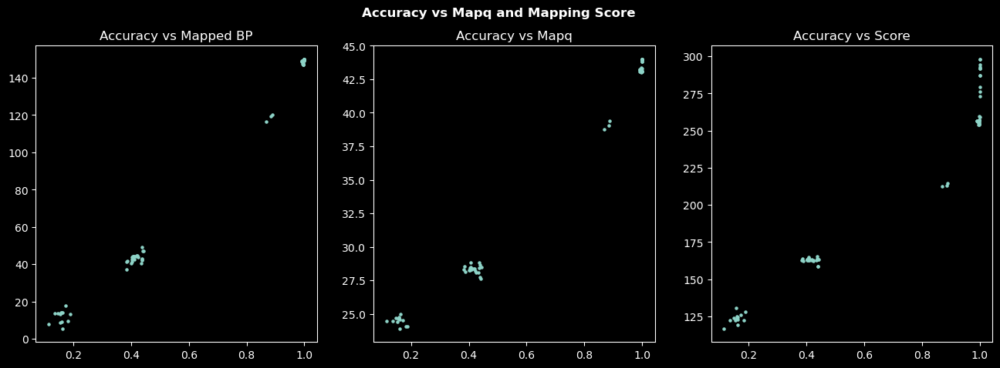

In [ ]:
df_ = grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)

fig,(ax1,ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(16, 5))
fig.suptitle('Accuracy vs Mapq and Mapping Score', fontweight='bold')
ax1.scatter(x=df_.accuracy, y=df_.loc[:,'mapped-bp'], s=5)
ax1.set_title('Accuracy vs Mapped BP')
ax2.scatter(x=df_.accuracy, y=df_.mapq, s=5)
ax2.set_title('Accuracy vs Mapq')
ax3.scatter(x=df_.accuracy, y=df_.score, s=5)
ax3.set_title('Accuracy vs Score')
plt.show()

13 23 23 30 69


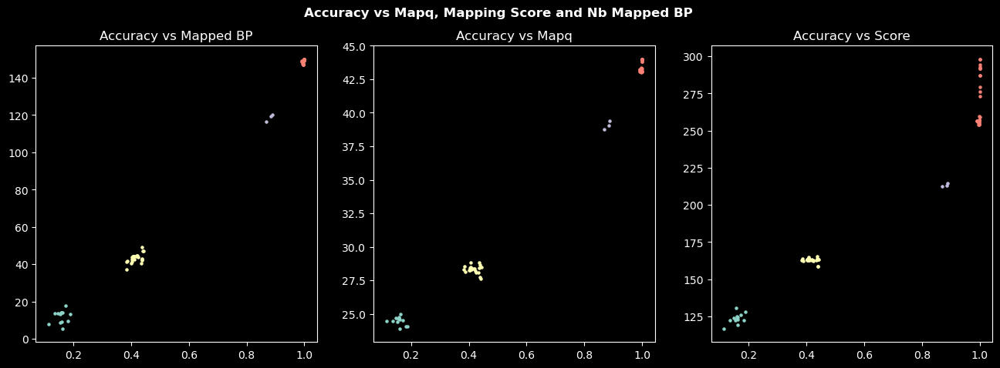

In [ ]:
df_ = grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)
low_acc_idx = df_.loc[df_.accuracy < 0.3, :].index
middle_low_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.3, :].index).intersection(set(df_.loc[df_.accuracy < 0.6, :].index)))
middle_high_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.8, :].index).intersection(set(df_.loc[df_.mapq < 41., :].index)))
high_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.8, :].index).intersection(set(df_.loc[df_.mapq >= 41., :].index)))

print(len(low_acc_idx), len(middle_low_acc_idx), len(middle_low_acc_idx), len(high_acc_idx), df_.shape[0])

fig,(ax1,ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(16, 5))
fig.suptitle('Accuracy vs Mapq, Mapping Score and Nb Mapped BP', fontweight='bold')
clusters_idxs = [low_acc_idx, middle_low_acc_idx, middle_high_acc_idx, high_acc_idx]
for idxs in clusters_idxs:
    ax1.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'mapped-bp'], s=5)
    ax1.set_title('Accuracy vs Mapped BP')
    ax2.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'mapq'], s=5)
    ax2.set_title(f'Accuracy vs Mapq')
    ax3.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'score'], s=5)
    ax3.set_title('Accuracy vs Score')
    
plt.show()

In [ ]:
for cluster, idxs in zip(['low', 'middle_low', 'middle_high', 'high'],clusters_idxs):
    print(f"Cluster {cluster} ({len(idxs)} refseqs):")
    for idx in idxs:
        print(f" - {idx}: {df_refseqs.loc[idx, 'info']}")

Cluster low (13 refseqs):
 - 11089:ncbi:7: AY968065 (Uganda_1948)
 - 11089:ncbi:3: DQ235229 (Ethiopia_1961)
 - 11089:ncbi:1: AY968064 (Angola_1971)
 - 11089:ncbi:63: MW960207 (yp.bam from : MW960207.1)
 - 11089:ncbi:57: KU949599 (shanghai_2016)
 - 11089:ncbi:54: MW960207 (Yellow_fever_YF118_CAR_2018)
 - 11089:ncbi:58: MG589641 (China_Hsapiens_2016)
 - 11089:ncbi:56: KY495641 (China_Hsapiens_2016)
 - 11089:ncbi:55: JN620362 (Uganda_Hsapiens_2010)
 - 11089:ncbi:59: KX268355 (China_Hsapiens_2016)
 - 11089:ncbi:60: KY587416 (China_Hsapiens_2016)
 - 11089:ncbi:61: MH633692 (China_Hsapiens_2016)
 - 11089:ncbi:62: MF004383 (432429_S4_MF004383.1)
Cluster middle_low (23 refseqs):
 - 11089:ncbi:38: HM582851 (TrinidadandTobago_Alouetta_seniculus_2009)
 - 11089:ncbi:42: KM388817 (Venezuela_Guarico_Allouetta_seniculus_2004)
 - 11089:ncbi:45: MK583152 (Brazil_SaoPaulo_Hsapiens_2017)
 - 11089:ncbi:49: MF370549 (Brazil_monkey_2015)
 - 11089:ncbi:46: MK583166 (Brazil_SaoPaulo_Hsapiens_2018)
 - 11089:nc

In [ ]:
threshold = 0.75
poor_alignment_idxs = grp_by_refseq.mean().loc[grp_by_refseq.mean().aligned < threshold, :].sort_values('aligned', ascending=False).index
print(f"{len(poor_alignment_idxs):,d} reference sequences for which less than {int(threshold*100)}% of the reads could be aligned:")
for idx in poor_alignment_idxs:
    print(f" - {idx}: {df_refseqs.loc[idx, 'info']}")

# print(set(poor_alignment_idxs).difference(set(low_acc_idx).union(set(middle_low_acc_idx))))
# print((set(low_acc_idx).union(set(middle_low_acc_idx))).difference(set(poor_alignment_idxs)))

36 reference sequences for which less than 75% of the reads could be aligned:
 - 11089:ncbi:38: HM582851 (TrinidadandTobago_Alouetta_seniculus_2009)
 - 11089:ncbi:32: JF912181 (Brazil_Hsapiens_1983)
 - 11089:ncbi:37: JF912190 (Brazil_Hsapiens_2002)
 - 11089:ncbi:39: KM388814 (Venezuela_Portuguesa_Hsapiens_2005)
 - 11089:ncbi:40: KM388815 (Venezuela_Apure_Aseniculus_2007)
 - 11089:ncbi:53: MF370530 (Brazil_Haemagogus-janthinomys_2017)
 - 11089:ncbi:52: MK333805 (Brazil_IlhaGrande_Sabethes_chloropterus_2018)
 - 11089:ncbi:49: MF370549 (Brazil_monkey_2015)
 - 11089:ncbi:35: JF912182 (Brazil_Hsapiens_1984)
 - 11089:ncbi:41: KM388818 (Venezuela_Barinas_Aseniculus_2006)
 - 11089:ncbi:44: MH666058 (Brazil_Sapajus_sp_2016)
 - 11089:ncbi:50: MF370535 (Brazil_Allouatta_sp_2016)
 - 11089:ncbi:36: JF912188 (Brazil_Hsapiens_2000)
 - 11089:ncbi:31: MF004382 (Bolivia_Hsapiens_1999)
 - 11089:ncbi:47: MK760660 (Netherlands_brazil_2018)
 - 11089:ncbi:46: MK583166 (Brazil_SaoPaulo_Hsapiens_2018)
 - 11089

These reference sequences with poor alignment are the same as the two low accuracy clusters

### Impact of mutations on accuracy, per position

The following analyse the impact of the number of mutations compared to the training reference sequence, per position in the reference sequence.

In [ ]:
ds.sample(5)

,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,bin,aligned,mappedseqid,mapped-bp,mapq,score,position
11089:ncbi:35-4622,11089:ncbi:35,True,118,118,2908,4,1.127219,0.305182,983,False,None,0,NaN,NaN,NaN
11089:ncbi:32-7441,11089:ncbi:32,True,118,118,1513,6,0.346154,0.131762,511,False,None,0,NaN,NaN,NaN
11089:ncbi:51-2093,11089:ncbi:51,True,118,118,4673,5,0.987796,0.292426,1580,False,None,0,NaN,NaN,NaN
11089:ncbi:36-133,11089:ncbi:36,True,118,118,5443,4,0.657175,0.230948,1841,False,None,0,NaN,NaN,NaN
11089:ncbi:31-421,11089:ncbi:31,True,118,118,10038,1,0.299926,0.118160,3396,False,None,0,NaN,NaN,NaN


Analyse the threshold for `mapped-bp`: review various quantiles of `mapped-bp` for several accuracy thresholds:

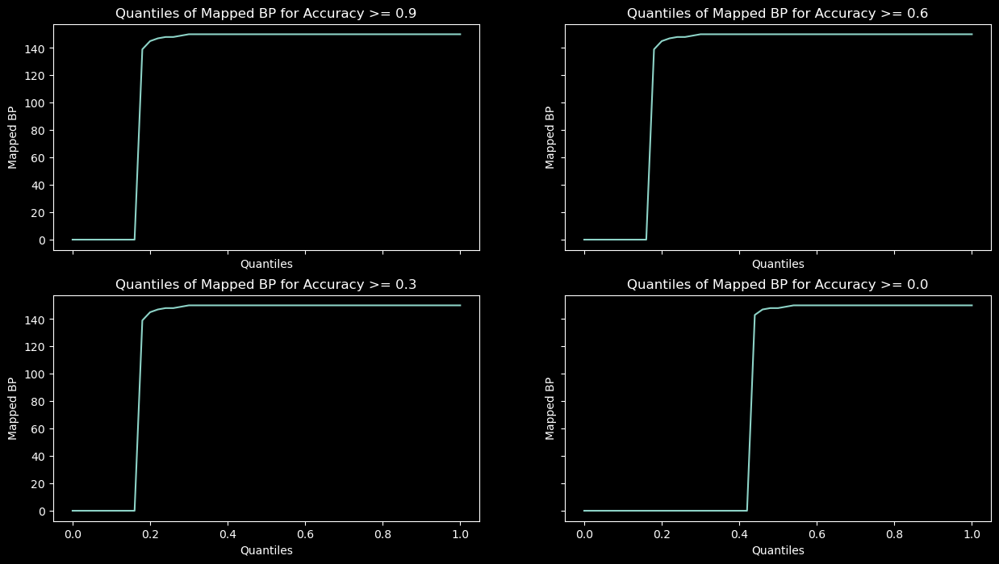

In [ ]:
acc_thresholds = [0.9, 0.6, 0.3, 0.0]

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,8), sharex=True, sharey=True)
for acc_threshold, ax in zip(acc_thresholds, axs.flatten()):
    high_accuracy_reads = ds.loc[ds.accuracy >= acc_threshold, 'mapped-bp']
    vals = []
    qs = np.linspace(0,1,51)
    for q in qs:
        vals.append(high_accuracy_reads.quantile(q=q))
    ax.set_title(f"Quantiles of Mapped BP for Accuracy >= {acc_threshold}")
    ax.set_xlabel('Quantiles')
    ax.set_ylabel('Mapped BP')
    ax.plot(qs, vals)
plt.show()

Not all reads are aligned. Plot the average alignment rate for the simulated reads, per position for all reference sequences

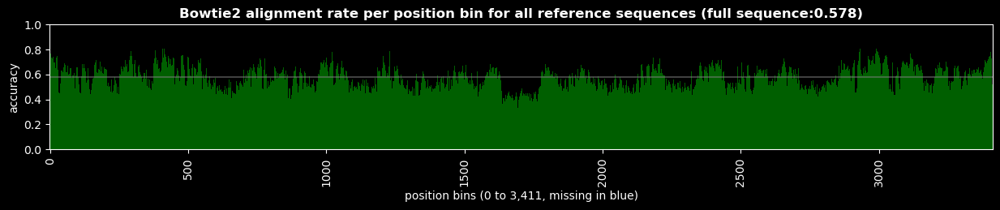

In [ ]:
nb_position_bins = ds.bin.max()

aln_ylim = (0,1)
aln_threshold = 0
bar_w = 1 

aln_rate = ds.aligned.mean()
ds_grouped = ds.groupby(by='bin')
aln_rate_per_bin = ds_grouped.sum()['aligned']/ds_grouped.count()['aligned']
aln_rate_reindexed = aln_rate_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
missing_bins = pd.Series(index=aln_rate_reindexed.index, data=1.0)
missing_bins.loc[aln_rate_reindexed.notna()] = np.nan

fig,ax1 = plt.subplots(nrows=1, ncols=1, figsize=(15,2))
colors_aln = aln_rate_reindexed.apply(lambda acc: 'green' if acc > aln_threshold else 'red')
aln_rate_per_bin.plot(ax=ax1, kind='bar', ylim=aln_ylim, width=bar_w, color=colors_aln, alpha=0.75, legend=False)
missing_bins.plot(ax=ax1, kind='bar', ylim=aln_ylim, width=bar_w, color='blue', alpha=0.5, legend=False)
ax1.set_title(f"Bowtie2 alignment rate per position bin for all reference sequences (full sequence:{aln_rate:.3f})",fontweight='bold')
ax1.hlines(y=aln_rate, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
ax1.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
ax1.set_ylabel('accuracy')
ticks = range(0,nb_position_bins+1,500)
ax1.set_xticks(ticks, ticks);

Plot the average alignment rate per position, per reference sequence

In [ ]:
def plot_alignment_rate_per_position(ds: pd.DataFrame, refseqid:str, metric='aligned', figsize=(15,2)):
    """ ...???"""
    ds_ = ds.loc[ds['refseqid'] == refseqid, :]
    nb_position_bins = ds_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    aln_rate = ds_.aligned.mean()
    aln_rate_per_bin = ds_.groupby('bin')['aligned'].sum() / ds_.groupby('bin')['aligned'].count()
    aln_rate_reindexed = aln_rate_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=aln_rate_reindexed.index, data=1.0) # np.nan is type float, so we use 1.0
    missing_bins.loc[aln_rate_reindexed.notna()] = np.nan

    fig,ax1 = plt.subplots(nrows=1, ncols=1, figsize=figsize, sharex=True)

    # Plot Accuracy
    aln_ylim = (0,1)
    aln_threshold = 0.6
    bar_w = 1 
    colors_acc = aln_rate_reindexed.apply(lambda acc: 'green' if acc > aln_threshold else 'red')

    aln_rate_reindexed.plot(ax=ax1, kind='bar', ylim=aln_ylim, width=bar_w, color=colors_acc, legend=False)
    missing_bins.plot(ax=ax1, kind='bar', ylim=aln_ylim, width=bar_w, color='blue', alpha=0.5, legend=False)
    ax1.set_title(f"Bowtie2 alignment rate per position bin for {info} (full sequence:{aln_rate:.3f})",fontweight='bold')
    ax1.hlines(y=aln_rate, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax1.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax1.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax1.set_xticks(ticks, ticks)

    plt.show()

# plot_alignment_rate_per_position(ds, '11089:ncbi:1', metric='mapped-bp')
# plot_alignment_rate_per_position(ds, '11089:ncbi:6', metric='mapped-bp')
# plot_alignment_rate_per_position(ds, '11089:ncbi:37', metric='mapped-bp')

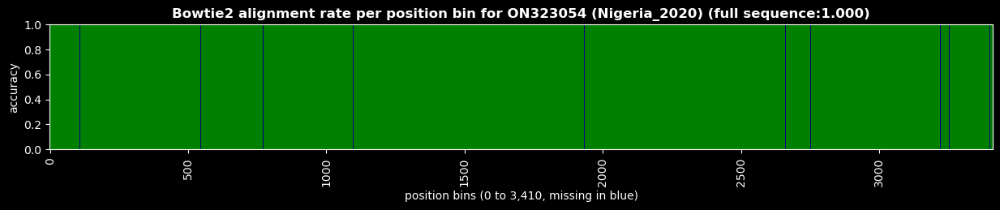

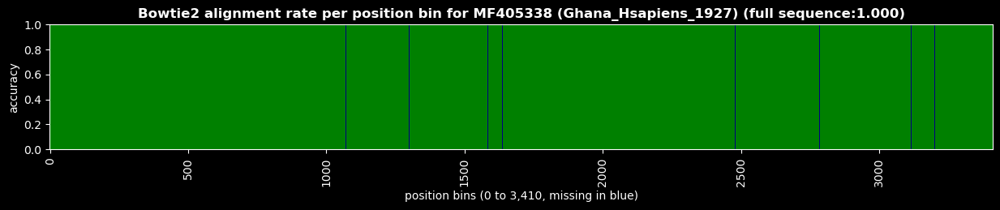

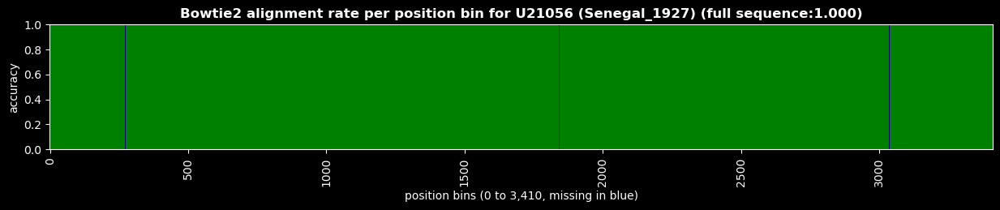

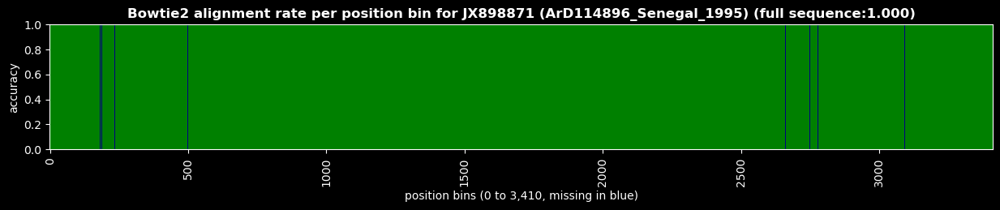

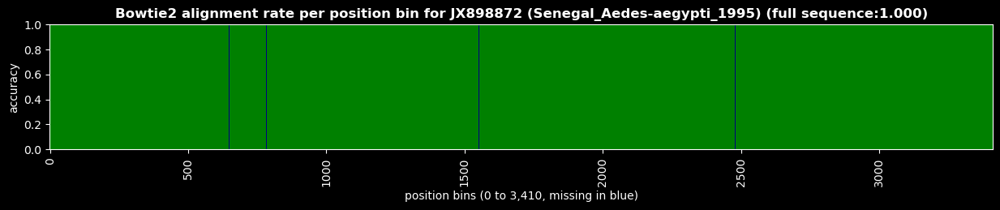

...

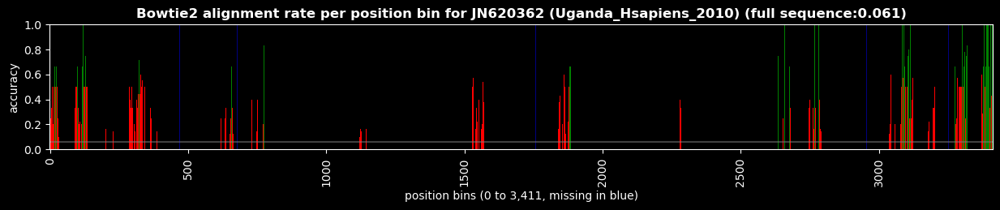

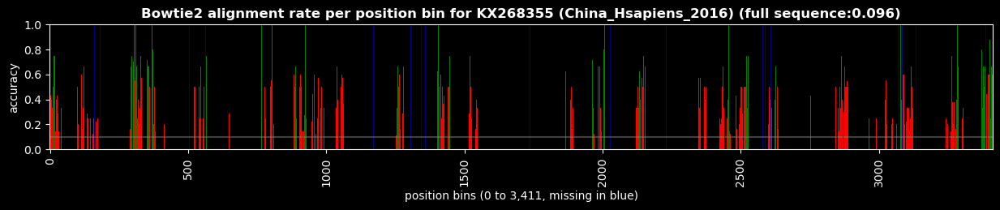

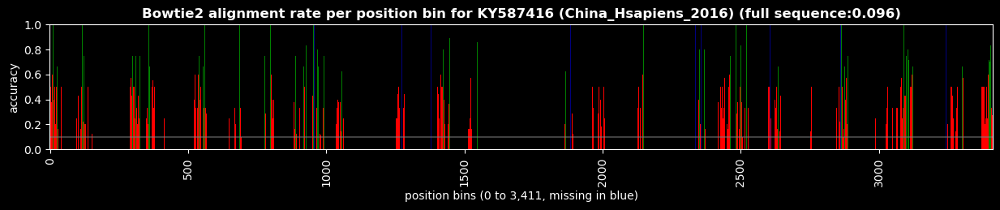

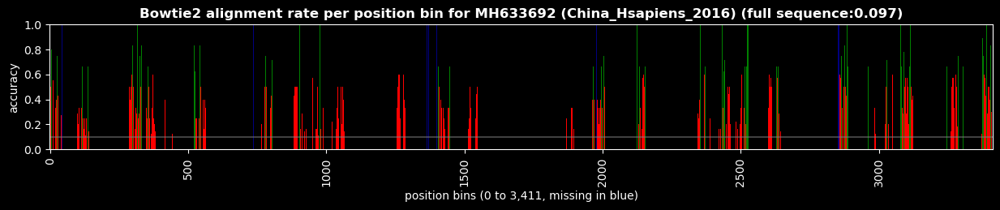

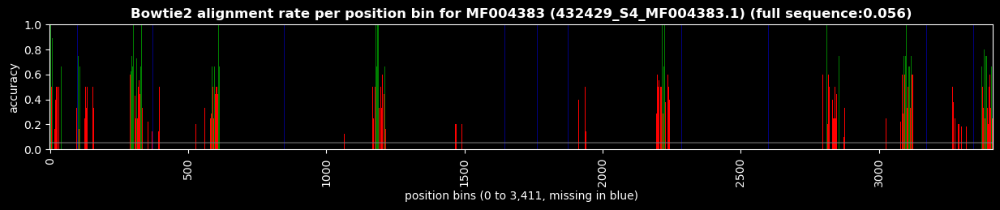

In [ ]:
ordered_refseq_index = df_refseqs.sort_values(by=['mean acc'], ascending=False).index
for refseqid in ordered_refseq_index:
    plot_alignment_rate_per_position(ds, refseqid, metric='mapped-bp')

Plot the average number of mapped base pairs for each position, per reference sequence

In [ ]:
def plot_mapped_bp_per_position(ds: pd.DataFrame, refseqid:str, metric='mapped-bp', figsize=(15,2*2+1)):
    """Takes a dataframe with position bins and plots the ...???"""
    ds_ = ds.loc[ds['refseqid'] == refseqid, :]
    nb_position_bins = ds_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    accuracy = ds_['accuracy'].mean()
    acc_per_bin = ds_.groupby('bin')['accuracy'].mean()
    acc_reindexed = acc_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=acc_reindexed.index, data=1.0) # np.nan is type float, so we use 1.0
    missing_bins.loc[acc_reindexed.notna()] = np.nan
    score = ds_[metric].mean()
    score_per_bin = ds_.groupby('bin')[metric].mean()
    score_reindexed = score_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)

    fig,(ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=figsize, sharex=True)
    fig.suptitle(f"Per Position Analysis for {info}", fontsize=16,fontweight='bold')

    # Plot Alignement Score
    acc_ylim = (0,1)
    acc_threshold = 0.6
    bar_w = 1 
    colors_acc = acc_reindexed.apply(lambda acc: 'green' if acc > acc_threshold else 'red')

    acc_reindexed.plot(ax=ax1, kind='bar', ylim=acc_ylim, width=bar_w, color=colors_acc, legend=False)
    missing_bins.plot(ax=ax1, kind='bar', ylim=acc_ylim, width=bar_w, color='blue', alpha=0.5, legend=False)
    ax1.set_title(f"Accuracy per position bin (full sequence:{accuracy:.3f})",fontweight='bold')
    ax1.hlines(y=accuracy, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax1.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax1.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax1.set_xticks(ticks, ticks)

    # Plot scores 
    if metric == 'mapped-bp':
        score_threshold = 100
        score_ylim = (0,150)
    elif metric == 'mapq':
        score_threshold = 60
        score_ylim = (0,30)
    elif metric == 'score':
        score_threshold = 400
        score_ylim = (0,500)
    else:
        score_threshold = 0.0
        score_ylim = (0,5)

    def color_score(row):
        acc, score = row
        if acc >= acc_threshold: high_acc = True
        else: high_acc = False
        if score >= score_threshold: high_score = True
        else: high_score = False
        color = 'green' if high_acc and high_score else 'red' if not high_acc else 'yellow'
        return color
    
    colors_score = pd.concat([acc_reindexed, score_reindexed], axis=1).apply(color_score, axis=1)
    score_reindexed.plot(ax=ax2, kind='bar', ylim=score_ylim, width=bar_w, color=colors_score, legend=False)
    missing_bins.plot(ax=ax2, kind='bar', ylim=score_ylim, width=bar_w, color='blue', alpha=0.5, legend=False)
    ax2.set_title(f"{metric} per position bin (full sequence:{score:.3f})",fontweight='bold')
    ax2.hlines(y=score, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax2.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax2.set_ylabel(metric)
    ax2.set_xticks(ticks, ticks)

    plt.subplots_adjust(hspace=.25)
    plt.show()

# plot_mapped_bp_per_position(ds, '11089:ncbi:1')
# plot_mapped_bp_per_position(ds, '11089:ncbi:6')
# plot_mapped_bp_per_position(ds, '11089:ncbi:37')

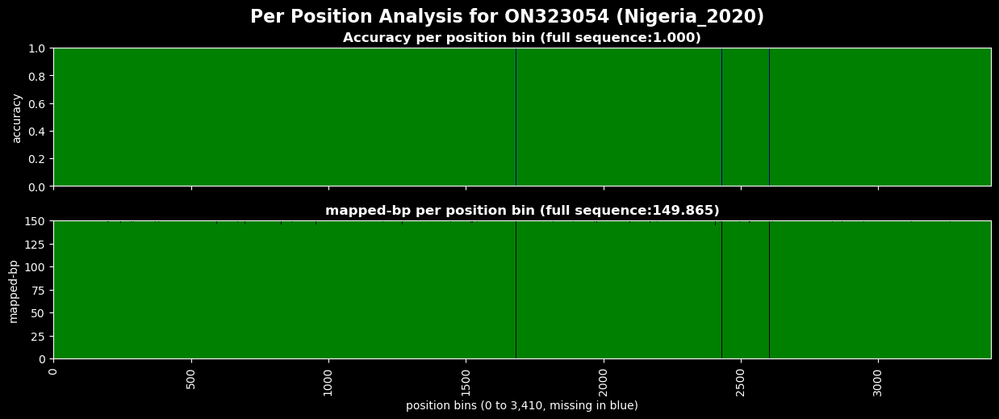

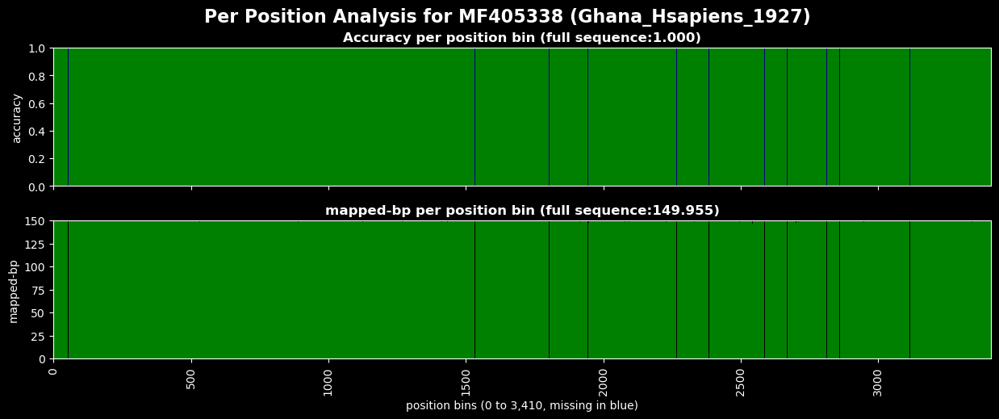

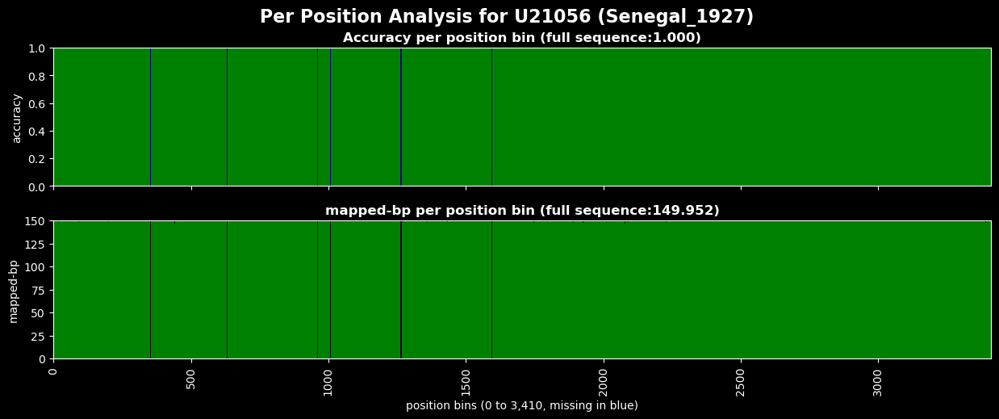

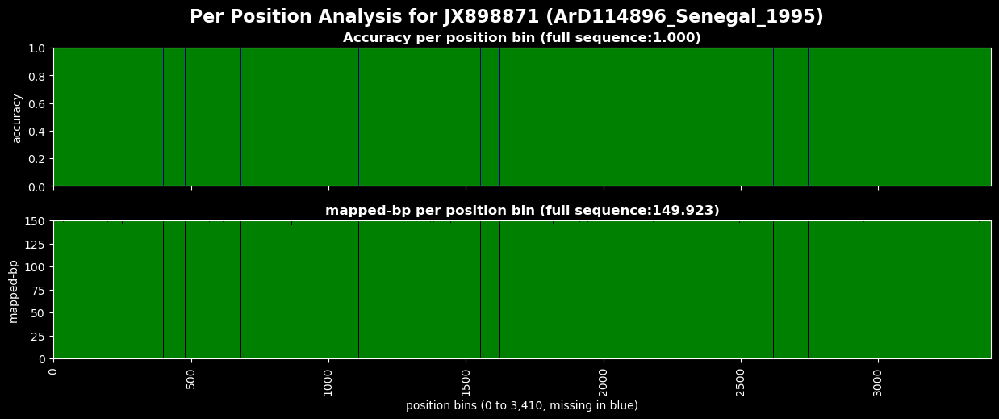

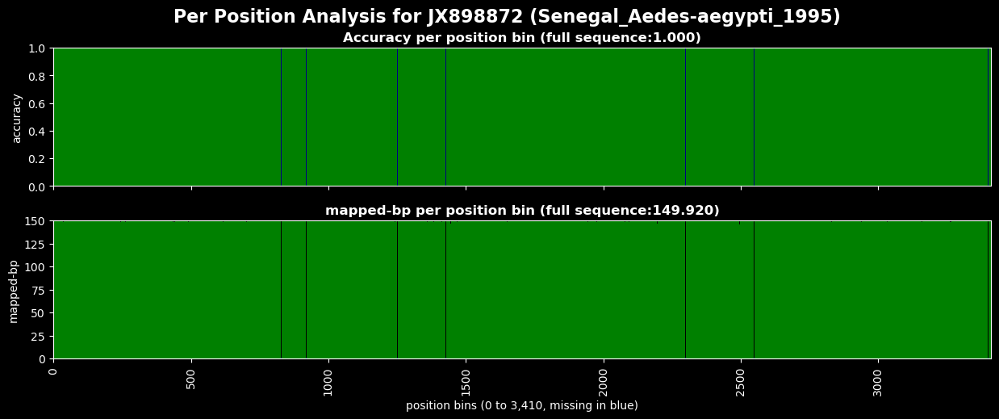

...

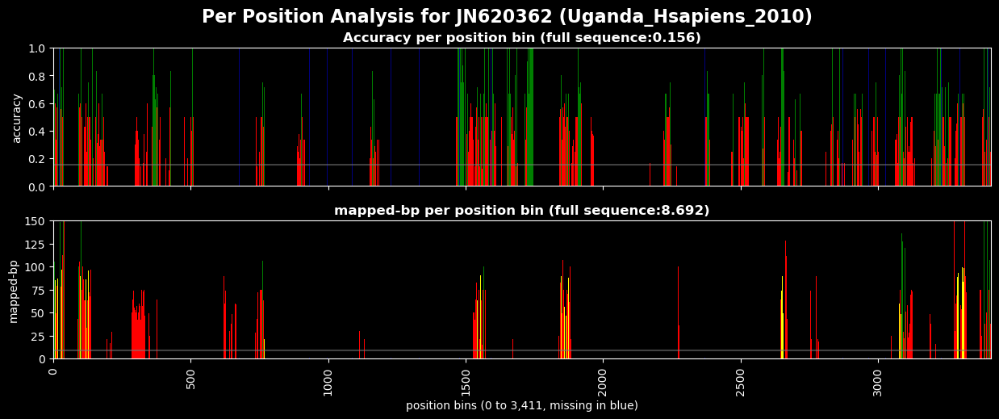

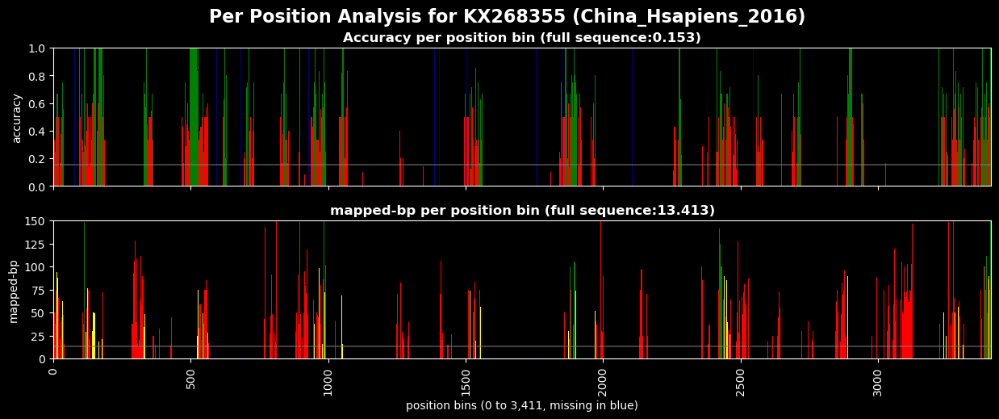

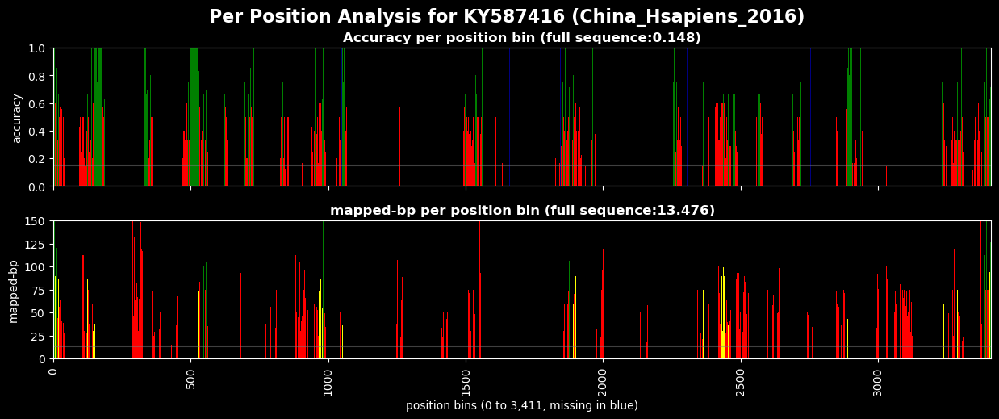

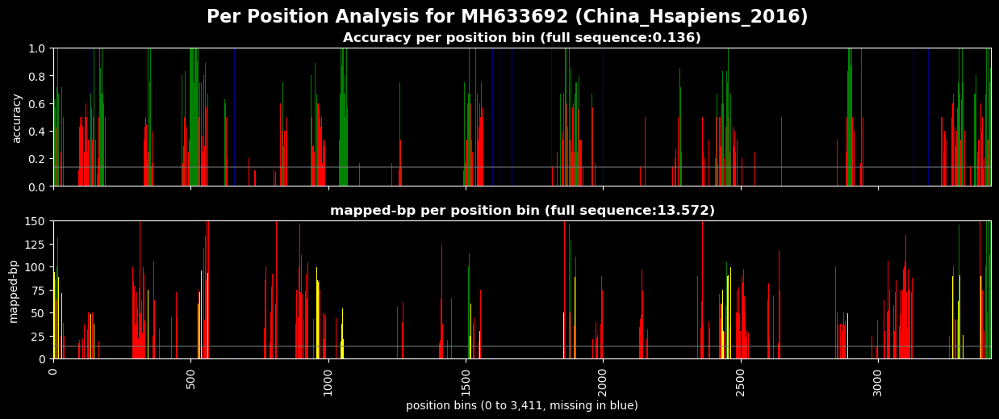

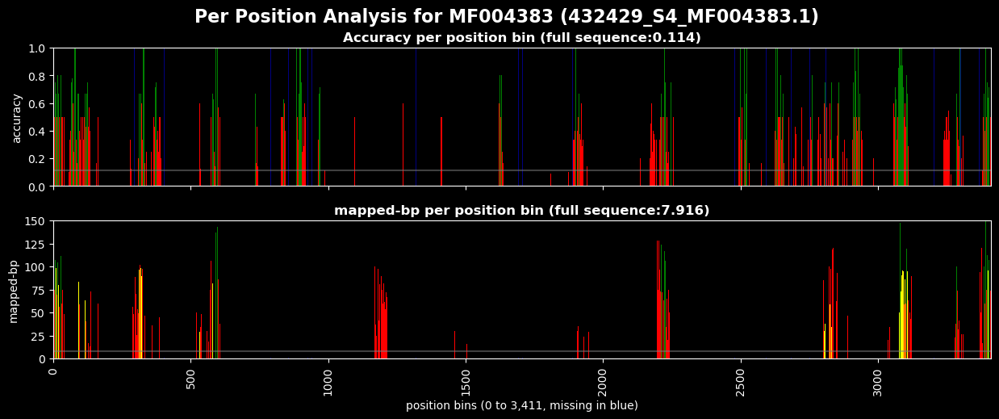

In [ ]:
ordered_refseq_index = df_refseqs.sort_values(by=['mean acc'], ascending=False).index
for refseqid in ordered_refseq_index:
    plot_mapped_bp_per_position(ds, refseqid, metric='mapped-bp')

# 6. Next steps:
- CNN Virus Inference Analysis 
    - YFV:
        - Create high level functions for each steps and include into the metagentools package
        - Create a notebook with the full pipeline for this yellow fever analysis with high level functions
    - CoV NCBI simreads:
        - Identify the training sequence
        - run pipeline on the NCIB CoV simreads
    - Real reads:
        - run pipeline on the real reads


- Finetune CNN Virus model:
    - Select one to three reference sequences beside NC_002031.1 for finetuning (ordered to allow experiments)
    - Simulate reads from these reference sequences, with ART Illumina, with the same fold as above
    - Filter reads by nb of mutations to NC_002031.1 into a finetuning dataset (ftds_1, ftds_2, ftds_3)
    - Filter simreads to drop any refseq in fine tuning dataset, and make it a test set
    - Finetune and analyse the model with finetining dataset: 
        - first finetune with one additional sequence (ftds_1), 
        - evaluate the model with the test set, using the analysis pipeline defined above
        - then finetune with the second additional sequence (ftds_2),
        - evaluate the model with the test set
        - then finetune with the third additional sequence (ftds_3),
        - evaluate the model with the test set

# Sandbox

## Package to help parsing SAM files



`Bio.Align.parse(source, fmt)`

Parse an alignment file and return an iterator over alignments.

Arguments:
-`source` - File or file-like object to read from, or filename as string.
-`fmt` - String describing the file format (case-insensitive).

Typical usage, opening a file to read in, and looping over the alignments:

`Bio.Align.sam.AlignmentIterator(source)`

Alignment iterator for Sequence Alignment/Map (SAM) files.

Each line in the file contains one genomic alignment, which are loaded and returned incrementally. The following columns are stored as attributes of the alignment:
- `flag`: The FLAG combination of bitwise flags;
-`mapq`: Mapping Quality (only stored if available)
- `rnext`: Reference sequence name of the primary alignment of the next read in the alignment (only stored if available)
- `pnext`: Zero-based position of the primary alignment of the next read in the template (only stored if available)
- `tlen`: signed observed template length (only stored if available)

Other information associated with the alignment by its tags are stored in the `annotations` attribute of each alignment.

Any hard clipping (clipped sequences not present in the query sequence) are stored as ‘hard_clip_left’ and ‘hard_clip_right’ in the annotations dictionary attribute of the query sequence record.

The sequence quality, if available, is stored as ‘phred_quality’ in the `letter_annotations` dictionary attribute of the query sequence record.

fmt: str | None= 'SAM'

In [ ]:
from Bio import Align

In [ ]:
p2sam = pfs.data / 'ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam'
p2sam.is_file()

True

`QNAME               FLAG  RNAME  POS  MAPQ  CIGAR  RNEXT  PNEXT  TLEN  SEQ  QUAL  TAGS`

Unaligned read
```
11089:ncbi:1-17000	4	*	0	0	*	*	0	0	TGAGTACTTTGTGAGCCAATCATCAGAGTCTCTAAACACAAAGATGCCATCTCCGCATTTGAGCTCGCGTTTCCCAAAGTTGACAGCACATCCTTGGTCAGCCCCAACTCCCAATGAAAGAAACATCATGATCACACCTACCAAGATCAT	CCCGCGGGGGGGGJJ=CJJJJGJCJJJJJJGJJJJJ1JGJCJGJJJJJGJGGGGGJGGGJ=JGGGGGGGGGGGG=GGGGCGGGGCCGGGGGGCGCGGGC=JGGGGGGGC=CG=GGCGGGGCC=GGGCGCGGGCCCGGGGC=GCCGGGGG=	YT:Z:UU
```
Aligned read
```
11089:ncbi:1-16485	0	11089:ncbi:0	25	23	150M	*	0	0	AAAACCCTGGGCGTCAATATGGTAAGACGAGGGGTTCGCTCCTTGTCAAACAAAATAAAACAAAAAACAAAACAGATTGGAAACAGACCTGGCCCTTCAAGAGGTGTTCAAGGATTTATTTTCTTCTTTTTGTTTAACATTCTGACTGGG	=CCCGGG1GGGGGJCJJJJGJ=JCJGGJJGCJJGJJJGJJJGGGJGGGC=GCCJC=CGJGGJCGCJCJJGGGCG=GCC=GGGGGGGGGCGCGCGCGCGGCCGGCG(CCCCGGGCCGGG8CCCGGGCGGGGCGC=CC=GCGGGCGCC=C==	AS:i:-45	XN:i:0	XM:i:9	XO:i:0	XG:i:0	NM:i:9	MD:Z:24C7A41A17A26C2T11C6T7A0	YT:Z:UU
```

In [ ]:
alignments = Align.parse(p2sam, 'sam')
type(alignments)

Bio.Align.sam.AlignmentIterator

In [ ]:
print(type(alignments))
for k in alignments.__dict__.keys():
    print(f"{k:15s}:", getattr(alignments, k))

<class 'Bio.Align.sam.AlignmentIterator'>
source         : /home/vtec/projects/bio/metagentools/data/ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam
_stream        : <_io.TextIOWrapper name='/home/vtec/projects/bio/metagentools/data/ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam' mode='rt' encoding='UTF-8'>
_index         : 0
metadata       : {'HD': {'VN': '1.5', 'SO': 'unsorted', 'GO': 'query'}, 'PG': [{'ID': 'bowtie2', 'PN': 'bowtie2', 'VN': '2.5.4', 'CL': '"/home/vtec/miniconda3/envs/bowtie/bin/bowtie2-align-s --wrapper basic-0 --local -x NC_002031.1 -S single_69seq_cnn_virus_refseq_trimmed.sam -U /home/vtec/projects/bio/metagentools/data/ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.fq"'}]}
targets        : [SeqRecord(seq=Seq(None, length=10236), id='11089:ncbi:0', name='<unknown name>', description='', dbxrefs=[])]
_line          : 11089:ncbi:1-17000	4	*	0	0	*	*	0	0	CACAACAGAGGGATCACTGTGATTGAATTCCAGCCACTGACCAAAAGTATGACCACAGATATGTTCATTTTCATTAAGGGAATTCC

`Align.parse` returns an iterator `Bio.Align.sam.AlignmentIterator` object.

`dict_keys(['sequences', 'coordinates', 'flag', 'mapq', 'annotations'])`

Search for the first read that was aligned (FLAG = 0) and show Align attributes

In [ ]:
print('Attributes for non aligned reads (FLAG=4):')
alignments = Align.parse(p2sam, 'sam')
for a in alignments:
    if (i+1)%10_000 == 0: print(i+1)
    if a.flag == 4:
        print(type(a))
        for k in a.__dict__.keys():
            print(f"  {k:15s}:", getattr(a, k))
        break

print('\nAttributes for aligned reads (FLAG=0):')
alignments = Align.parse(p2sam, 'sam')
for a in alignments:
    if (i+1)%10_000 == 0: print(i+1)
    if a.flag == 0:
        print(type(a))
        for k in a.__dict__.keys():
            print(f"  {k:15s}:", getattr(a, k))
        break

Attributes for non aligned reads (FLAG=4):
<class 'Bio.Align.Alignment'>
  sequences      : [None, SeqRecord(seq=Seq('CACAACAGAGGGATCACTGTGATTGAATTCCAGCCACTGACCAAAAGTATGACC...TAC'), id='11089:ncbi:1-17000', name='<unknown name>', description='', dbxrefs=[])]
  coordinates    : None
  flag           : 4
  mapq           : 0
  annotations    : {'YT': 'UU'}

Attributes for aligned reads (FLAG=0):
<class 'Bio.Align.Alignment'>
  sequences      : [SeqRecord(seq=Seq({27: 'ACCCTGGGCGTCAATATGGTACGACGAGGAGTTCGCTCCTTGTCAAACAAAATA...AAA'}, length=10236), id='11089:ncbi:0', name='<unknown name>', description='', dbxrefs=[]), SeqRecord(seq=Seq('ACCCTGGGCGTCAATATGGTAAGACGAGGGGTTCGCTCCTTGTCAAACAAAATA...AAA'), id='11089:ncbi:1-16999', name='<unknown name>', description='', dbxrefs=[])]
  coordinates    : [[ 27 177]
 [  0 150]]
  flag           : 0
  mapq           : 42
  score          : 235
  annotations    : {'XN': 0, 'XM': 9, 'XO': 0, 'XG': 0, 'NM': 9, 'YT': 'UU'}


Make a list of all the FLAGs in the SAM file

In [ ]:
# alignments = Align.parse(p2sam, 'sam')
# flags = [0,4]
# for a in alignments:
#     if a.flag not in flags:
#         print(a.sequences[1].id, a.flag)
#         flags.append(a.flag)
# flags

- FLAG = 0 means that the read is aligned
- FLAG = 4 means that the read is unaligned
- FLAG = 16 means that the read is aligned to the reverse strand

```
sequences      : [SeqRecord(seq, id, name, description, dbxrefs), SeqRecord(seq, id, name, description, dbxrefs)]
coordinates    : array[[start_in_refseq end_in_refseq], [ start_read end_read]]
flag           : 0, 4 or 16
mapq           : int
score          : int
annotations    : {'XN': 0, 'XM': 16, 'XO': 0, 'XG': 0, 'NM': 16, 'YT': 'UU'}
```

## Naive mutation analysis 

Comparing base pairs in each position as we use the aligned reference sequence `pos_alg` for bining.

In [ ]:
fa_aligned.reset_iterator()
ids = []
accessions = []
organism = []
mutations = []
for o in fa_aligned:
    meta = fa_aligned.parse_text(o['definition line'])
    ids.append(meta['seqid'])
    accessions.append(meta['accession'])
    organism.append(meta['organism'])
    seq = o['sequence']
    d = [(bp1,bp2) for bp1,bp2 in zip(seq, cnn_virus_seq) if bp1 != bp2]
    mutations.append(len(d))
    

df_mutations = pd.DataFrame(data={'accession': accessions, 'organism':organism, 'mutations': mutations}, index=ids)
df_mutations

,accession,organism,mutations
11089:ncbi:1,AY968064,Angola_1971,3974
11089:ncbi:2,U54798,Ivory_Coast_1982,3134
11089:ncbi:3,DQ235229,Ethiopia_1961,3964
11089:ncbi:4,AY572535,Gambia_2001,2821
11089:ncbi:5,MF405338,Ghana_Hsapiens_1927,2572
...,...,...,...
11089:ncbi:65,ON323053,Nigeria_2020,2684
11089:ncbi:66,ON323054,Nigeria_2020,2630
11089:ncbi:67,OM066735,VHF-21-014/GHA/Damongo/2021,3397
11089:ncbi:68,OM066736,VHF-21-029/GHA/Daboya/2021,3382


Bins are defined by the limits in `bin_limits`, created when we binned the positions.

In [ ]:
bin_limits[:5], bin_limits[-5:]

([-10, 2, 5, 8, 11], [10074, 10077, 10080, 10083, 10086])

Now we want to create a list of tuples (position_start, position_end), giving the minimum first BP position and the maximum last BP position for all reads in each bin. 

Note: the total length between position_starty and position_end should be equal to 150 + size of bin.

In [ ]:
bin_low_limit = np.array(bin_limits)
bin_high_limit = bin_low_limit + 150
read_ranges = [(max(0,l),h) for l,h in zip(bin_low_limit[:-1], bin_high_limit[1:])]
nb_bins, len(read_ranges), read_ranges[:5]

(3412, 3412, [(0, 152), (2, 155), (5, 158), (8, 161), (11, 164)])

build a dataset as a dictionary:
```python
{
    'refseqid': {
        'accuracy': accuracy,
        'preds_score': preds_score,
        'probs_score': probs_score,
        'reads': {
            pos: {
                'range': (start, end)
                'read': 'sequence,
                'mutations': mutations
            }
        }
    }
}
```

In [ ]:
refseqid = '11089:ncbi:1'

df_ = df.loc[df['refseqid'] == refseqid, :]
base_seqid = '11089:ncbi:6'
base_seq = all_seqs[base_seqid]['sequence']

cnn_virus_seq = cnn_virus_meta['11089:ncbi:0']['sequence']

info = df_refseqs.loc[refseqid,'info']
seq = all_seqs[refseqid]['sequence']

accuracy = df_refseqs.loc[refseqid,'mean acc']
preds_score = df_['preds_score'].mean()
probs_score = df_['probs_score'].mean()

refseq_dict = {}
refseq_dict['refseqid'] = refseqid
refseq_dict['info'] = info
refseq_dict['definition line'] = all_seqs[refseqid]['definition line']
refseq_dict['sequence'] = seq
refseq_dict['accuracy'] = accuracy
refseq_dict['preds_score'] = preds_score
refseq_dict['probs_score'] = probs_score

cnn_virus_reads = [cnn_virus_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
base_reads = [base_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
base_mutations = [compare_seqs(base=c, seq=b)[0] for c,b in zip(cnn_virus_reads, base_reads)]
reads = [seq[s:e] for k, (s,e) in enumerate(read_ranges)]
mutations = [compare_seqs(base=b, seq=s)[0] for b,s in zip(base_reads, reads)]

refseq_dict['position'] = {i:{'base':b, 'cnn_virus':c,'read':r, 'base_mutation':bm, 'mutation':m} for i,(b,c,r,bm,m) in enumerate(zip(base_reads,cnn_virus_reads, reads,base_mutations,mutations))}

n = 3100
print(refseq_dict['position'][n]['cnn_virus'])
print(refseq_dict['position'][n]['base_mutation'])
print(refseq_dict['position'][n]['base'])
print(refseq_dict['position'][n]['mutation'])
print(refseq_dict['position'][n]['read'])


ATGATGAACAGGAGATCTTGAACTACATGAGCCCACATCACAAAAAACTGGCACAAGCAGTGATGGAAATGACATACAAGAACAAAGTGGTGAAAGTGTTGAGACCAGCCCCAGGAGGGAAAGCCTACATGGATGTCATAAGTCGACGAGACC
 CCT   TG T  ACAGGA  T  TG ACTA ATGAGC CAC TC CAAAAA  TG   CAAGCA TG   GA ATG CAT    GAACAAAGTG   AAAGTGTTGAGA    CCCCAGG  GGA AGCCT CA GGATGTCAT A TCGA 
ACCTTGATGATGAACAGGAGATCTTGAACTACATGAGCCCACATCACAAAAAACTGGCACAAGCAGTGATGGAAATGACATACAAGAACAAAGTGGTGAAAGTGTTGAGACCAGCCCCAGGAGGGAAAGCCTACATGGATGTCATAAGTCGAC
    G     C  G  A      A   GT           TG A  A GG  G     CTGG  CA A                             C  G   C    G              C  G    T      CA    C  C  GA
ACCTGGATGACGAGCAAGAGATCATGAGTTACATGAGCCCTGAACAAAGGAAGCTGGCCTGGGCCATAATGGAAATGACATACAAGAACAAAGTGGTCAAGGTGCTGAGGCCAGCCCCAGGAGGCAAGGCCTTCATGGACATCATCAGCCGGA


In [ ]:
def analyze_position(df: pd.DataFrame, refseqid:str, cnn_virus_seq=cnn_virus_seq):
    base_seqid = '11089:ncbi:6'
    base_seq = all_seqs[base_seqid]['sequence']
    df_ = df.loc[df['refseqid'] == refseqid, :]
    
    info = df_refseqs.loc[refseqid,'info']
    seq = all_seqs[refseqid]['sequence']

    accuracy = df_refseqs.loc[refseqid,'mean acc']
    preds_score = df_['preds_score'].mean()
    probs_score = df_['probs_score'].mean()

    refseq_dict = {}
    refseq_dict['refseqid'] = refseqid
    refseq_dict['info'] = info
    refseq_dict['definition line'] = all_seqs[refseqid]['definition line']
    refseq_dict['sequence'] = seq
    refseq_dict['accuracy'] = accuracy
    refseq_dict['preds_score'] = preds_score
    refseq_dict['probs_score'] = probs_score

    cnn_virus_reads = [cnn_virus_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    base_reads = [base_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    reads = [seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    mutations_cnn_virus = [compare_seqs(base=c, seq=r)[0] for c,r in zip(cnn_virus_reads, reads)]
    mutations_base = [compare_seqs(base=b, seq=r)[0] for b,r in zip(base_reads, reads)]

    nb_diffs_cnn_virus = [compare_seqs(base=c, seq=s)[1] for c,s in zip(cnn_virus_reads, reads)]
    nb_diffs_base = [compare_seqs(base=b, seq=s)[1] for b,s in zip(base_reads, reads)]

    refseq_dict['position'] = {
        i:{
            'read':r, 
            'read_base':b, 
            'read_cnn_virus':c,
            'mutation_from_cnn_virus':mc, 
            'mutation_from_base':mb,
            'diffs_cnn_virus':dc,
            'diffs_base':db
            } 
        for i,(b,c,r,mc,mb, dc, db) in enumerate(zip(base_reads,cnn_virus_reads,reads,mutations_cnn_virus,mutations_base,nb_diffs_cnn_virus, nb_diffs_base))
        }


    return refseq_dict

analyze_position(df, '11089:ncbi:1')

In [ ]:
genome_dict = {}
for idx in ordered_index:
    genome_dict[idx] = analyze_position(df, idx)

p2json = pfs.data / 'ncbi/infer_results/yf-ncbi/analysis/genome-analysis.json'
with open(p2json, 'w') as f:
    json.dump(genome_dict, f, indent=4)

In [ ]:
genome_dict['11089:ncbi:1']

In [ ]:
refseqid = '11089:ncbi:1'
df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
good_pos = list(df_.loc[df_.accuracy > 0.75, :].index)
poor_pos = list(df_.loc[df_.accuracy < 0.25, :].index)
len(good_pos), good_pos[:5], len(poor_pos), poor_pos[:5]

(206, [9, 21, 22, 25, 28], 2459, [0, 1, 7, 10, 13])

In [ ]:
mutation_from_cnn_virus = []
mutation_from_base = []

df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
for bin, row in df_.iterrows():
    mutation_from_cnn_virus.append(genome_dict[refseqid]['position'][bin]['diffs_cnn_virus'])
    mutation_from_base.append(genome_dict[refseqid]['position'][bin]['diffs_base'])

df_['mutation_from_cnn_virus'] = mutation_from_cnn_virus
df_['mutation_from_base'] = mutation_from_base

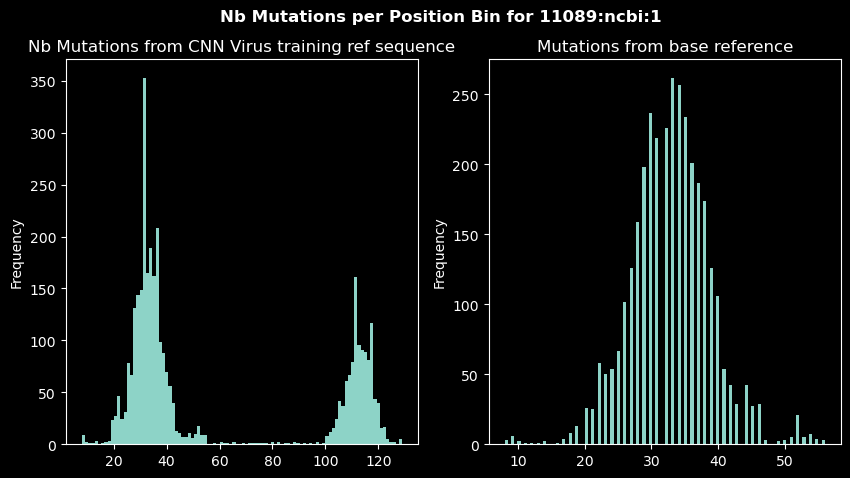

In [ ]:
fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
df_.mutation_from_cnn_virus.plot(ax=ax1,kind='hist', bins=100)
df_.mutation_from_base.plot(ax=ax2,kind='hist', bins=100)
fig.suptitle(f'Nb Mutations per Position Bin for {refseqid}', fontweight='bold')
ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
ax2.set_title('Mutations from base reference')
plt.show()

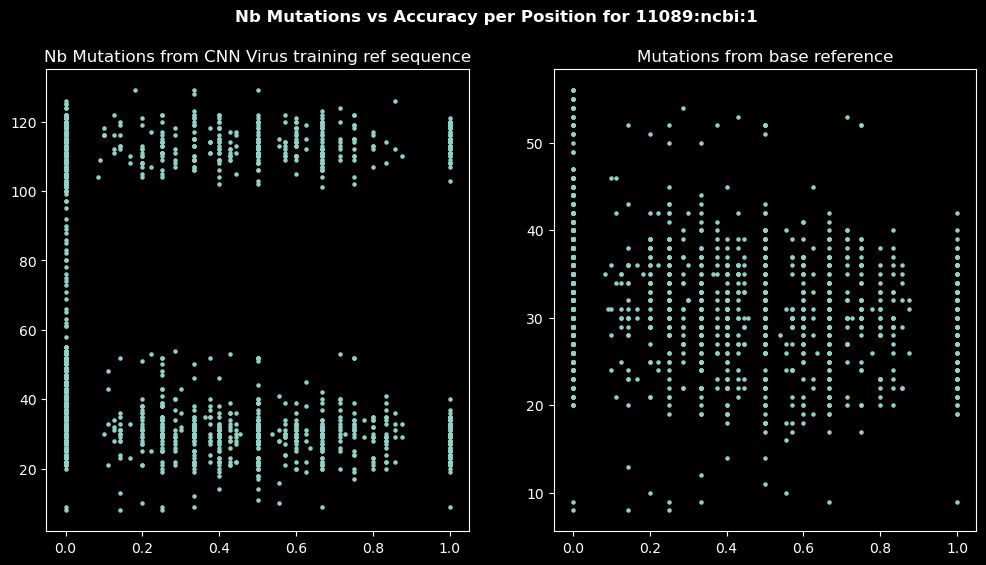

In [ ]:
fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
ax1.scatter(x=df_['accuracy'], y=df_['mutation_from_cnn_virus'], s=5)
ax2.scatter(x=df_['accuracy'], y=df_['mutation_from_base'], s=5)

fig.suptitle(f'Nb Mutations vs Accuracy per Position for {refseqid}', fontweight='bold')
ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
ax2.set_title('Mutations from base reference')
plt.show()

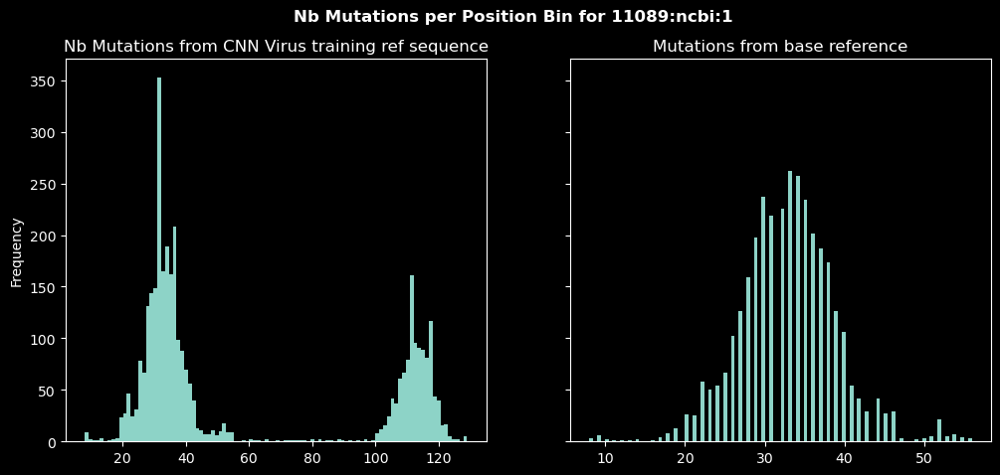

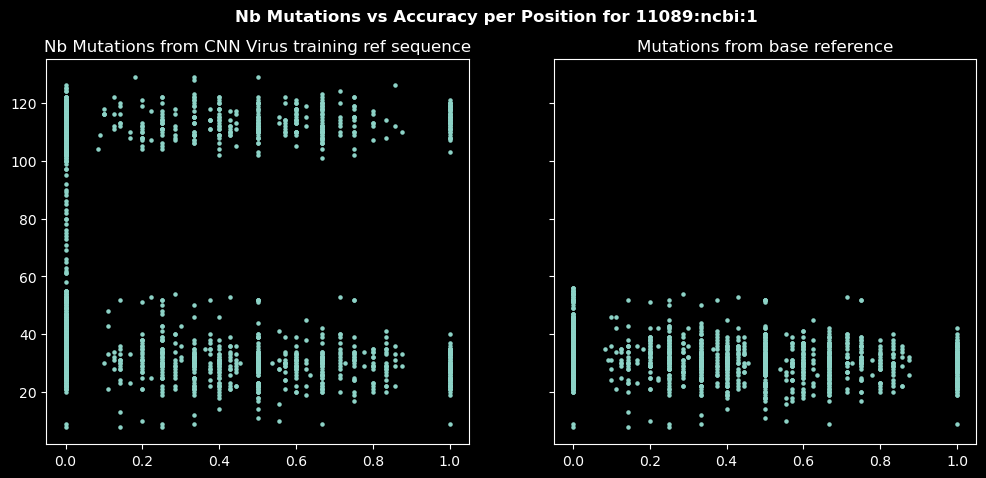

In [ ]:
def mutation_analysis(df:pd.DataFrame, refseqid):
    df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
    df_['bin'] = df_.index
    df_['mutation_from_cnn_virus'] = df_['bin'].apply(lambda b: genome_dict[refseqid]['position'][b]['diffs_cnn_virus'])
    df_['mutation_from_base'] = df_['bin'].apply(lambda b: genome_dict[refseqid]['position'][b]['diffs_base'])

    fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharey=True)
    df_.mutation_from_cnn_virus.plot(ax=ax1,kind='hist', bins=100)
    df_.mutation_from_base.plot(ax=ax2,kind='hist', bins=100)
    fig.suptitle(f'Nb Mutations per Position Bin for {refseqid}', fontweight='bold')
    ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
    ax2.set_title('Mutations from base reference')
    plt.show()

    fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharey=True)
    ax1.scatter(x=df_['accuracy'], y=df_['mutation_from_cnn_virus'], s=5)
    ax2.scatter(x=df_['accuracy'], y=df_['mutation_from_base'], s=5)
    fig.suptitle(f'Nb Mutations vs Accuracy per Position for {refseqid}', fontweight='bold')
    ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
    ax2.set_title('Mutations from base reference')
    plt.show()

mutation_analysis(df, refseqid)

## Plot sequences in color

In [ ]:
def bp2color(string:str, rows=3)->np.ndarray:
    """
    Adenine (A): Often represented in green.
    Cytosine (C): Commonly shown in blue.
    Guanine (G): Frequently depicted in yellow or black.
    Thymine (T): Typically illustrated in red.
    """
    # s2c = {'A':np.array([0.,1.,0.]), 'C':np.array([0.,0.,1.]), 'G':np.array([1.,1.,0.]), 'T':np.array([1.,0.,0.]), ' ':np.array([0.,0.,0.])}
    s2c = {
        'A':np.array([143,199,150], dtype=np.uint8), 
        'C':np.array([131,208,240], dtype=np.uint8), 
        'G':np.array([255,245,154], dtype=np.uint8), 
        'T':np.array([241,159,193], dtype=np.uint8), 
        ' ':np.array([0,0,0], dtype=np.uint8)}
    return np.row_stack([np.expand_dims(np.array([s2c[s] for s in string]),axis=0)]*rows)

bp2color('ACGT')

array([[[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]],

       [[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]],

       [[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]]], dtype=uint8)

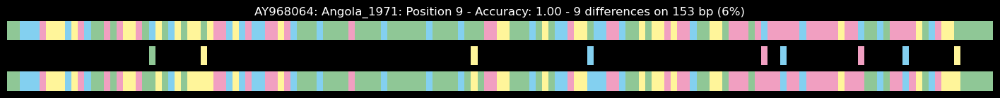

In [ ]:
def plot_reads(refseqid, position, acc):
    base = bp2color(genome_dict[refseqid]['position'][position]['base'])
    mutation = bp2color(genome_dict[refseqid]['position'][position]['mutation'])
    read = bp2color(genome_dict[refseqid]['position'][position]['read'])
    diffs = genome_dict[refseqid]['position'][position]['diffs']
    separator = np.zeros((1,base.shape[1],3), dtype=np.uint8)

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18,2))
    title = f"{genome_dict[refseqid]['info']}: Position {position} - Accuracy: {acc:.2f} - {diffs} differences on {base.shape[1]} bp ({diffs/base.shape[1]:.0%})"
    ax.set_title(title, fontsize=12)
    img = np.row_stack([base, separator, mutation, separator, read])
    ax.imshow(img, aspect='equal')
    ax.axis('off')
    plt.show()

plot_reads('11089:ncbi:1', good_pos[0], 1)

In [ ]:
for pos in good_pos[:20]:
    plot_reads(refseqid, pos, df_.loc[pos, 'accuracy'])

In [ ]:
for pos in poor_pos[:10]:
    plot_reads(refseqid, pos, df_.loc[pos, 'accuracy'])

## Define critical level for scores

In [ ]:
df.head(3)

,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4,bin
readid,,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,118,10,7804,0,0.296598,0.122977,118,32,10,62,94,7804
11089:ncbi:1-16999,11089:ncbi:1,False,118,2,6069,4,-0.024773,0.003527,62,2,32,9,1,6069
11089:ncbi:1-16998,11089:ncbi:1,False,118,144,5317,4,0.090977,0.233104,144,146,62,118,143,5317


In [ ]:
selected_refseqs = df_refseqs.sort_index().index

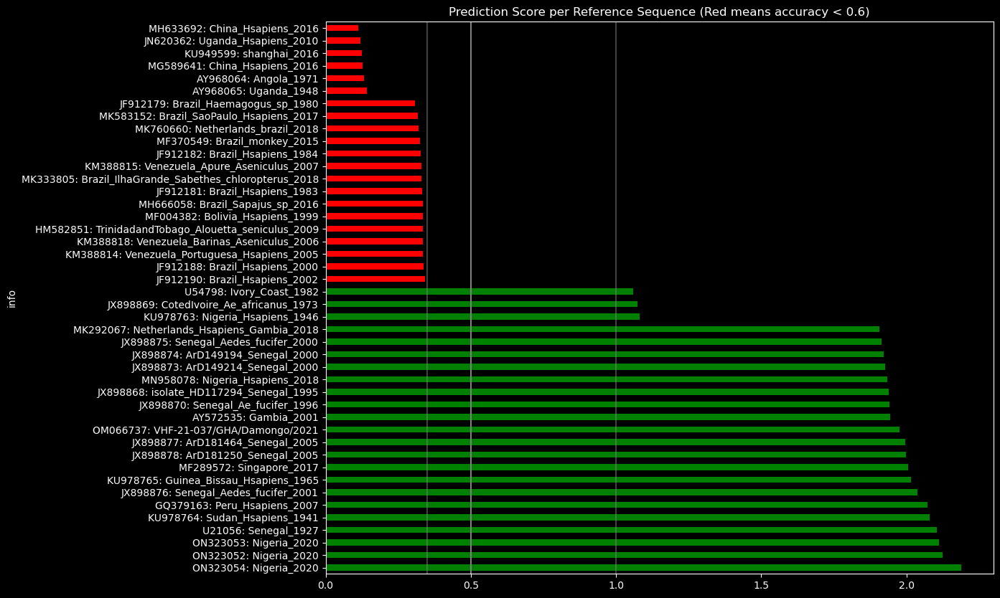

In [ ]:
grouped_by_refseq = df.groupby('refseqid').mean().loc[selected_refseqs,:].sort_values(by='preds_score', ascending=False)
grouped_by_refseq.index = df_refseqs.loc[grouped_by_refseq.index, 'info'].data.tolist()
fig, ax = plt.subplots(figsize=(12, 10))
colors = ['red' if x < 0.6 else 'green' for x in grouped_by_refseq['accuracy']]
grouped_by_refseq['preds_score'].plot(ax=ax,kind='barh', color=colors)
ax.set_title('Prediction Score per Reference Sequence (Red means accuracy < 0.6)')
ax.vlines(x=0.35, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid', alpha=0.5);
ax.vlines(x=0.5, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid');
ax.vlines(x=1.0, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid', alpha=0.5);

pred_score critical value at reference sequence level is somewhere between 0.35 and 1.0

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_by_posbin = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['refseqid','bin']).mean().sort_values(by='preds_score', ascending=False)
grouped_by_posbin.loc[('11089:ncbi:1', slice(None)),:].sample(5)

accuracy  lbl_true  lbl_pred  pos_true  pos_pred  \
refseqid     bin                                                      
11089:ncbi:1 4339       0.0     118.0       6.0    4339.0       8.0   
             7626       0.0     118.0      32.0    7626.0       4.0   
             8499       0.0     118.0     140.5    8499.0       8.0   
             1355       0.0     118.0     146.0    1355.0       8.0   
             2501       0.0     118.0      17.0    2501.0       2.0   

                   preds_score  probs_score  top_5_lbl_pred_0  \
refseqid     bin                                                
11089:ncbi:1 4339     0.041051     0.028388               6.0   
             7626     0.000000     0.000611              32.0   
             8499     0.181768     0.081779             133.5   
             1355     0.067678     0.038540             146.0   
             2501     0.134616     0.049993              74.5   

                   top_5_lbl_pred_1  top_5_lbl_pred_2  top_5_lbl_pred_3  \
refseqid     bin                                                          
11089:ncbi:1 4339             137.0              62.0              97.0   
             7626              44.0              20.0               6.0   
             8499             144.0             133.5              61.0   
             1355              62.0              20.0             103.0   
             2501               6.0              83.0              35.0   

                   top_5_lbl_pred_4  
refseqid     bin                     
11089:ncbi:1 4339              74.0  
             7626             160.0  
             8499              29.0  
             1355              44.0  
             2501               8.0

In [ ]:
sorted(np.unique(np.array([b for a,b in grouped_by_posbin.index if b%500 == 0])))

[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000]

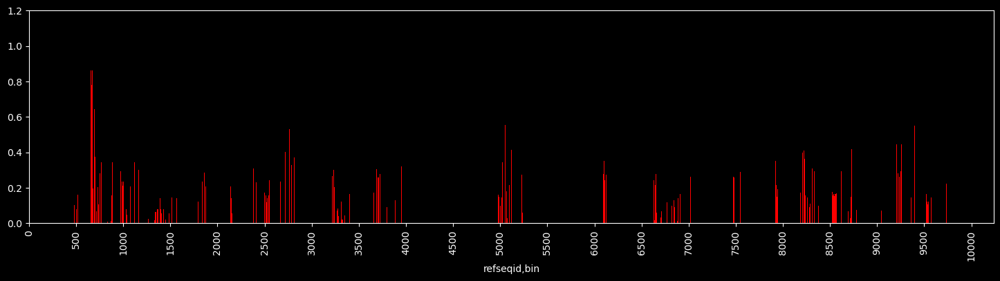

In [ ]:
refseqid = '11089:ncbi:30'

grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['refseqid','bin']).mean().sort_values(by='preds_score', ascending=False)
if refseqid in [seqid for seqid, binid in grouped_low_acc.index]:
    g = grouped_low_acc.loc[(refseqid, slice(None)), :].sort_index()
    full_index = [(refseqid, i) for i in range(nb_bins)]
    g = g.reindex(full_index, fill_value=np.nan)

    fig,ax = plt.subplots(figsize=(18, 4))
    colors = ['red' if x < 0.6 else 'green' for x in g['accuracy']]
    g.preds_score.plot(ax=ax, kind='bar', width=1, color=colors)
    ticks = sorted(np.unique(np.array([b for a,b in grouped_low_acc.index if b%500 == 0])))
    ax.set_xticks(ticks, ticks)
    ax.set_ylim(0,1.2)
    plt.show()

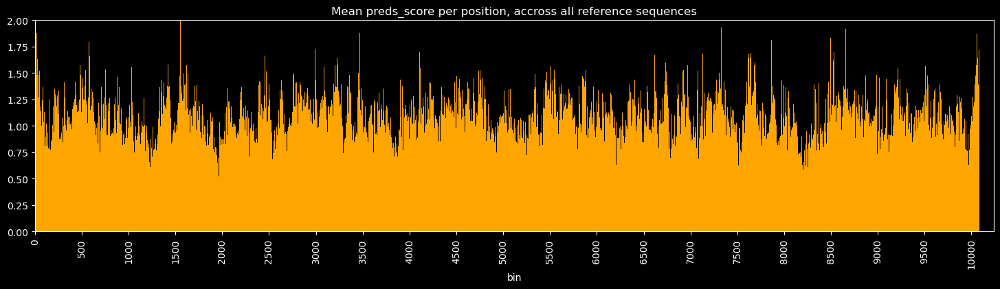

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.set_title('Mean preds_score per position, accross all reference sequences')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,2)
plt.show()

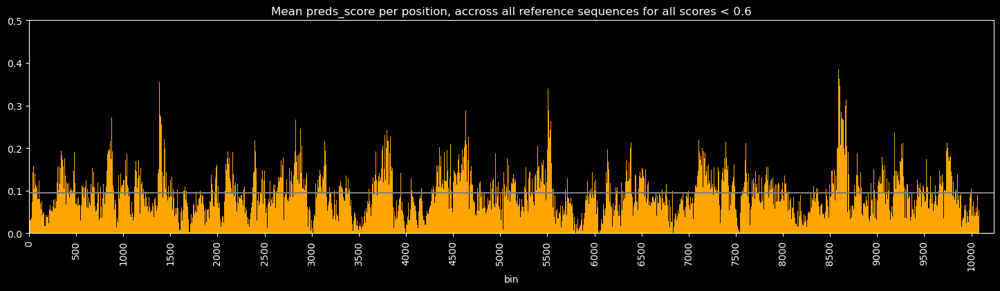

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.hlines(y=g.preds_score.mean(), xmin=0, xmax=nb_bins, color='gray', linestyles='solid')
ax.set_title('Mean preds_score per position, accross all reference sequences for all scores < 0.6')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,0.5)
plt.show()

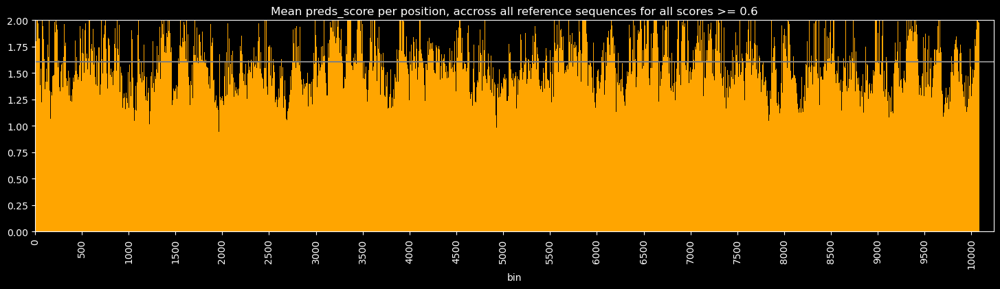

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy>=0.6, :].groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.hlines(y=g.preds_score.mean(), xmin=0, xmax=nb_bins, color='gray', linestyles='solid')
ax.set_title('Mean preds_score per position, accross all reference sequences for all scores >= 0.6')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,2)
plt.show()

# End of Section